In [1]:
# load packages
import os
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import pcntoolkit as pcn
import pickle

from scipy.stats import shapiro

from enigmatoolbox.utils.parcellation import parcel_to_surface
from enigmatoolbox.plotting import plot_cortical, plot_subcortical
from enigmatoolbox.utils.useful import reorder_sctx

from pcntoolkit.normative import estimate, predict, evaluate
from pcntoolkit.util.utils import compute_MSLL, create_design_matrix

ext_scripts_dir = ('/home/barbora/Documents/Projects/Normative_Models/ESO/braincharts/scripts')
os.chdir(ext_scripts_dir)

from nm_utils import remove_bad_subjects, load_2d

code_dir = ('/home/barbora/Documents/Projects/Normative_Models/ESO/code')
os.chdir(code_dir)

from clinics_desc_functions import prepare_data, plot_quality, trajectory_plotting, dk_roi_viz, load_clinics, en_qc

# formatiing
%matplotlib inline
%config InlineBackend.print_figure_kwargs = {'bbox_inches':None}

In [2]:
# Set seed
import random

def set_seed(seed=None, seed_torch=False):
  if seed is None:
    seed = 42
  random.seed(seed)
  np.random.seed(seed)
  if seed_torch:
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

  print(f'Random seed {seed} has been set.')

set_seed()

Random seed 42 has been set.


In [3]:
def extract_predictions(sex, dir, visit_data):
    """
    This function 
    - loads rescaled data of specified sex across all brain regions
    - appends appropriate age 
    - removes visit from index
    """
    os.chdir(dir)
    filelist=[]
    for dirpath, dirnames, filenames in os.walk("."):
        for filename in [f for f in filenames if f.endswith("y_rescaled_"+str(sex)+".txt")]:
            filelist.append(os.path.join(dirpath, filename))

    # change colname
    data = pd.concat([pd.read_csv(item, names=[item[:-4]]) for item in filelist], axis=1)
    data.columns = data.columns.str.split(r'/*/').str[1]

    # append age
    data.index = visit_data.loc[visit_data['sex'] == sex, 'age'].index
    data_concat = pd.concat([visit_data.loc[visit_data['sex'] == sex, 'age'],data],axis=1)

    # remove visit from index
    data_concat.index = data_concat.index.str.slice_replace(start=-2, repl='').to_numpy()

    return(data_concat)

In [4]:
def keep_long(v1, v2):
    """
    deletes subjects without both visits
    """
    common = v1.index.intersection(v2.index)
    v1 = v1.loc[common]
    v2 = v2.loc[common]
    
    return(v1, v2)

In [5]:
# where things are
main_dir = ('/home/barbora/Documents/Projects/Normative_Models/ESO')
models_dir = ('/home/barbora/Documents/Projects/Normative_Models/ESO/models/pretrained')
os.makedirs(models_dir, exist_ok=True)
cdata_dir = ('/home/barbora/Documents/Projects/2021_06_AZV_ESO/data')
fsdata_dir = ('/home/barbora/Documents/Projects/Normative_Models/ESO/fs_stats')
bdata_dir = ('/home/barbora/Documents/Projects/Normative_Models/ESO/backup')
images_dir = ('/home/barbora/Documents/Projects/Normative_Models/ESO/img')
pretrained_dir = ('/home/barbora/Documents/Projects/Normative_Models/ESO/braincharts')

In [6]:
# load data with clinics
v1 = pd.read_csv(os.path.join(models_dir, 'V1', 'te_Z.csv'),index_col=0)
v2 = pd.read_csv(os.path.join(models_dir, 'V2', 'te_Z.csv'),index_col=0)

In [7]:
# Load adjusted models predictions
v1_f = extract_predictions(0,os.path.join(models_dir,'V1'), v1)
v1_m = extract_predictions(1,os.path.join(models_dir,'V1'), v1)
v2_f = extract_predictions(0,os.path.join(models_dir,'V2'), v2)
v2_m = extract_predictions(1,os.path.join(models_dir,'V2'), v2)


In [12]:
# Keep only patients with both visits
v1_f, v2_f = keep_long(v1_f, v2_f)
v1_m, v2_m = keep_long(v1_m, v2_m)

In [14]:
v1_m.shape

(76, 186)

In [11]:
###
# Load dependencies for plotting
###
# which data columns do we wish to use as covariates? 
#cols_cov = ['age','sex']
# which sex do we want to plot? 
sex = 1 # 1 = male 0 = female
if sex == 1: 
    clr = 'blue'
    v1_plot = v1_m
    v2_plot = v2_m
else:
    clr = 'red'
    v1_plot = v1_f
    v2_plot = v2_f

# limits for cubic B-spline basis 
xmin = -5 
xmax = 110
model_name = 'lifespan_57K_82sites'
# Absolute Z treshold above which a sample is considered to be an outlier (without fitting any model)
outlier_thresh = 7
idp_ids = list(v1_f.columns[1:])

# create dummy data for visualisation
print('configuring dummy data ...')
xx = np.arange(xmin, xmax, 0.5)
X0_dummy = np.zeros((len(xx), 2))
X0_dummy[:,0] = xx # intercept
X0_dummy[:,1] = sex # sex covariate

X_dummy = create_design_matrix(X0_dummy, xmin=xmin, xmax=xmax, site_ids=None, all_sites=site_ids_tr)
#X_dummy = pd.read_csv(os.path.join(models_dir,'cov_bspline_dummy_mean.txt'),header=None, sep=' ')

cov_file_dummy = os.path.join(models_dir,'cov_bspline_dummy_mean.txt')
np.savetxt(cov_file_dummy, X_dummy)

# adjusting done on visit 1
visit_dir = os.path.join(models_dir,'V'+str(1))

Running IDP 0 rh_G_Ins_lg&S_cent_ins_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17623344]), 'Rho': array([0.36012152]), 'pRho': array([6.95631062e-09]), 'SMSE': array([0.87838757]), 'EXPV': array([0.1216274])}


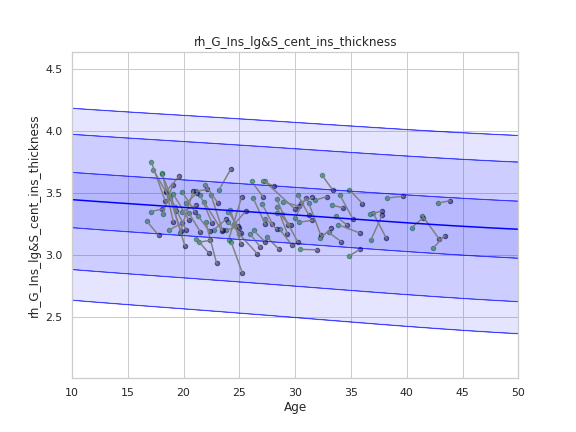

Running IDP 1 lh_S_interm_prim-Jensen_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1552044]), 'Rho': array([0.15044168]), 'pRho': array([0.01986938]), 'SMSE': array([1.06004636]), 'EXPV': array([0.00082524])}


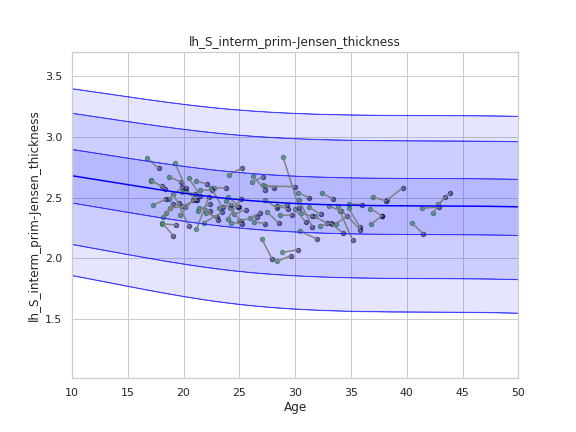

Running IDP 2 lh_S_precentral-inf-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13548152]), 'Rho': array([0.28107583]), 'pRho': array([9.10541325e-06]), 'SMSE': array([1.1360992]), 'EXPV': array([0.05262827])}


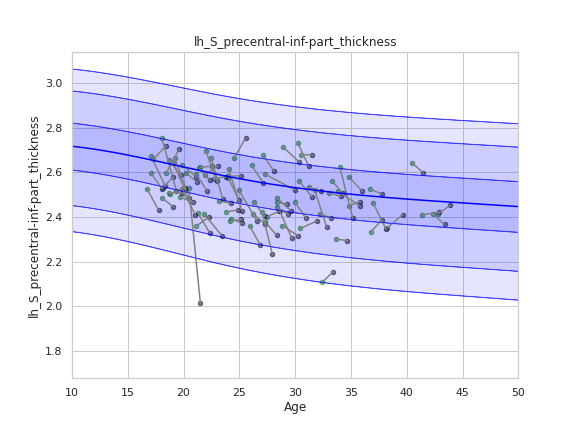

Running IDP 3 rh_G_front_inf-Orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18464625]), 'Rho': array([0.3870682]), 'pRho': array([3.53826906e-10]), 'SMSE': array([1.02824229]), 'EXPV': array([0.14946161])}


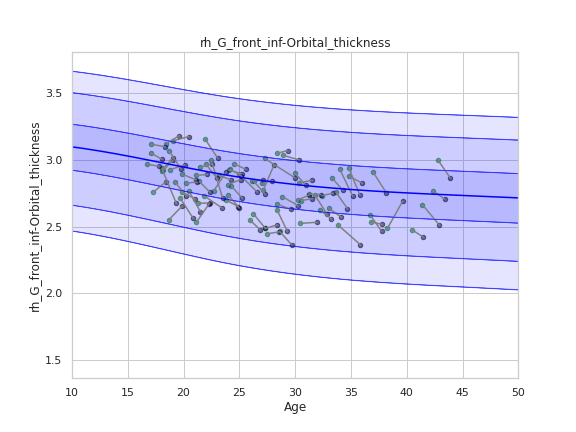

Running IDP 4 rh_G_precentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17157204]), 'Rho': array([0.14687607]), 'pRho': array([0.02303875]), 'SMSE': array([1.08216055]), 'EXPV': array([0.01601484])}


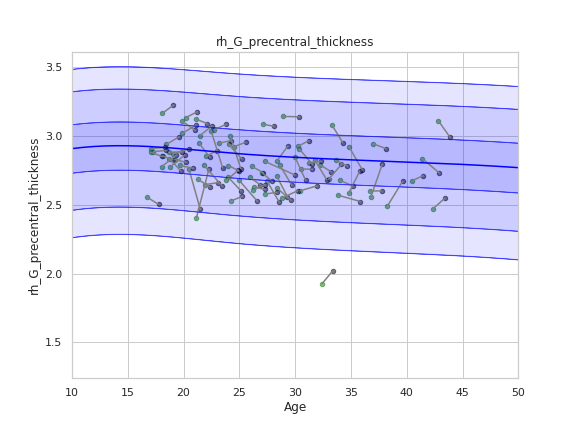

Running IDP 5 lh_S_precentral-sup-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15514837]), 'Rho': array([0.10209148]), 'pRho': array([0.11552392]), 'SMSE': array([1.41588562]), 'EXPV': array([-0.09312864])}


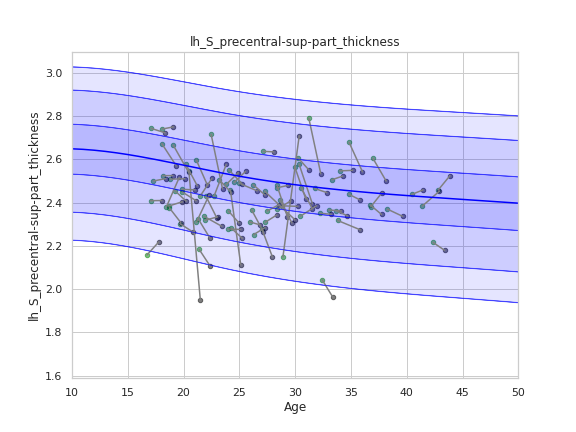

Running IDP 6 rh_Pole_temporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17588065]), 'Rho': array([-0.00155345]), 'pRho': array([0.98096061]), 'SMSE': array([1.04322145]), 'EXPV': array([-0.01188907])}


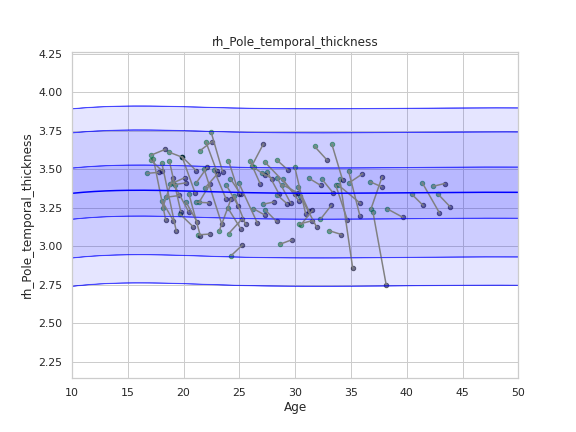

Running IDP 7 rh_S_precentral-inf-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12548518]), 'Rho': array([0.2959624]), 'pRho': array([2.77429535e-06]), 'SMSE': array([1.23307961]), 'EXPV': array([0.05594186])}


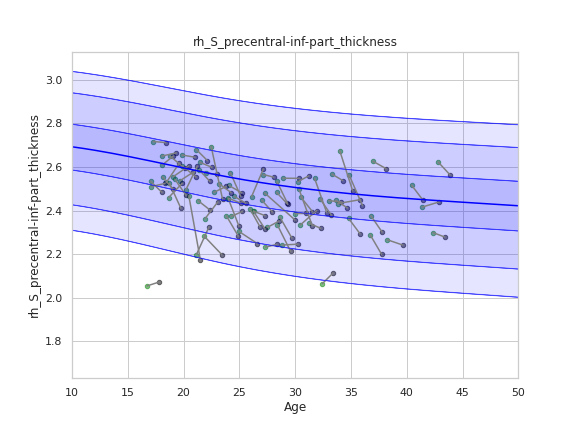

Running IDP 8 lh_S_collat_transv_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17727021]), 'Rho': array([0.17821264]), 'pRho': array([0.00565222]), 'SMSE': array([1.0373221]), 'EXPV': array([0.02633856])}


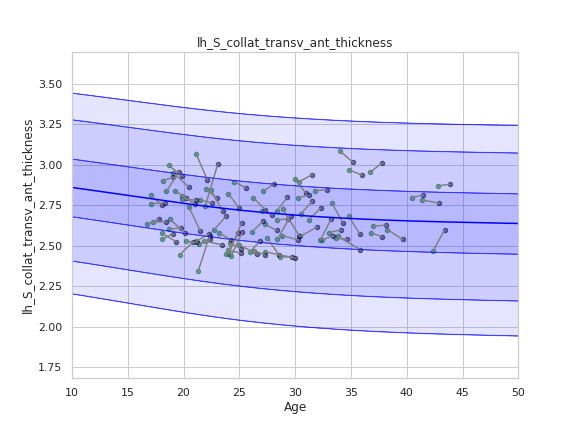

Running IDP 9 Brain-Stem :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([2069.18077799]), 'Rho': array([0.42940761]), 'pRho': array([1.7396456e-12]), 'SMSE': array([0.820153]), 'EXPV': array([0.18293239])}


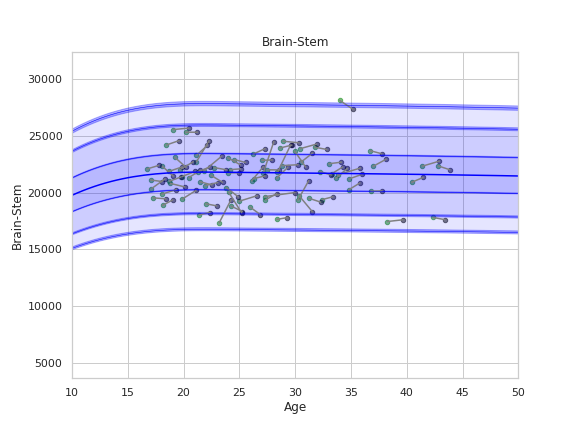

Running IDP 10 lh_S_orbital-H_Shaped_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12096661]), 'Rho': array([0.23834106]), 'pRho': array([0.00018902]), 'SMSE': array([1.28793649]), 'EXPV': array([0.00352482])}


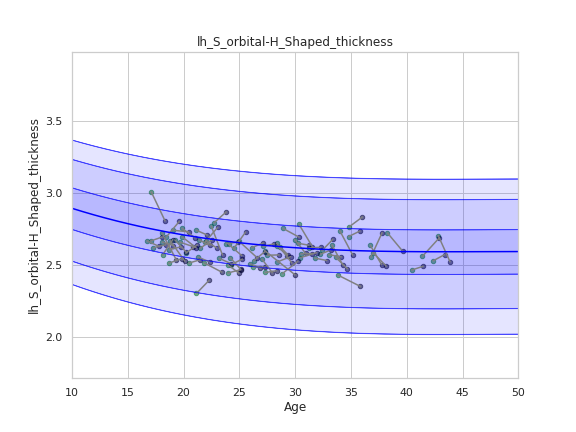

Running IDP 11 Left-Caudate :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([448.42388532]), 'Rho': array([0.36345012]), 'pRho': array([4.89179113e-09]), 'SMSE': array([0.8753952]), 'EXPV': array([0.12917085])}


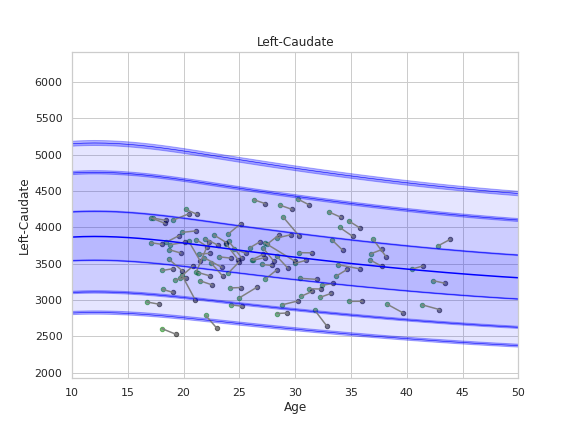

Running IDP 12 rh_G_temporal_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14875032]), 'Rho': array([0.35133562]), 'pRho': array([1.72588106e-08]), 'SMSE': array([0.92672742]), 'EXPV': array([0.12271849])}


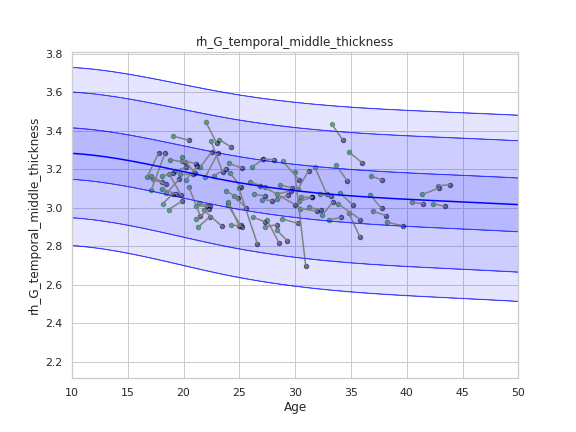

Running IDP 13 Left-Putamen :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([536.19342122]), 'Rho': array([0.42473795]), 'pRho': array([3.25695793e-12]), 'SMSE': array([0.82773651]), 'EXPV': array([0.17229428])}


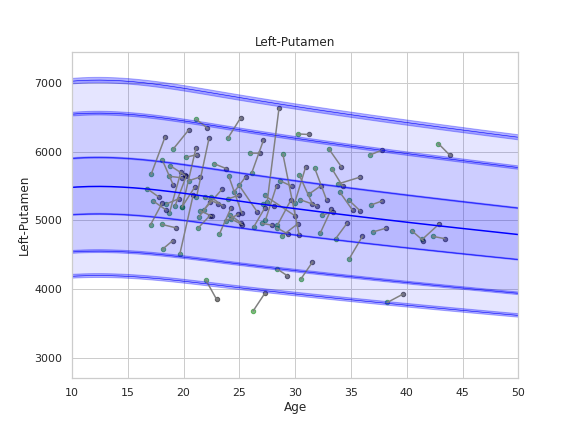

Running IDP 14 rh_S_pericallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14582589]), 'Rho': array([0.15903235]), 'pRho': array([0.013739]), 'SMSE': array([1.02970894]), 'EXPV': array([0.01541461])}


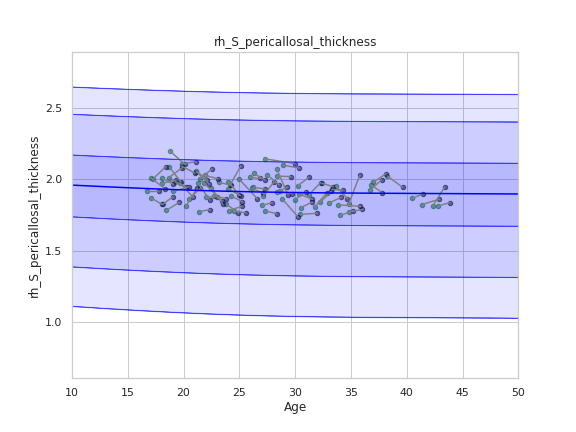

Running IDP 15 rh_G_pariet_inf-Supramar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12312314]), 'Rho': array([0.36292525]), 'pRho': array([5.17255751e-09]), 'SMSE': array([0.98396047]), 'EXPV': array([0.11984989])}


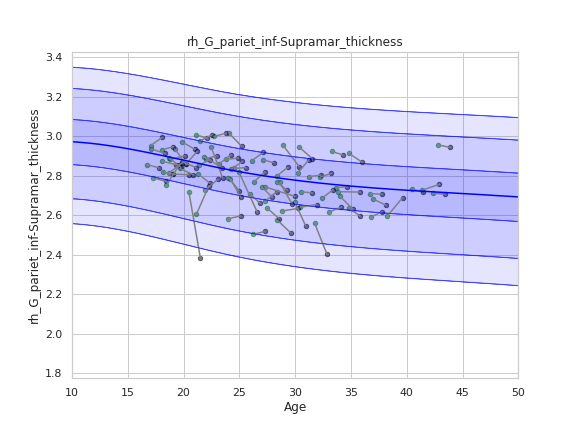

Running IDP 16 lh_G_temp_sup-G_T_transv_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1894555]), 'Rho': array([0.22496187]), 'pRho': array([0.00043799]), 'SMSE': array([0.98224153]), 'EXPV': array([0.04201962])}


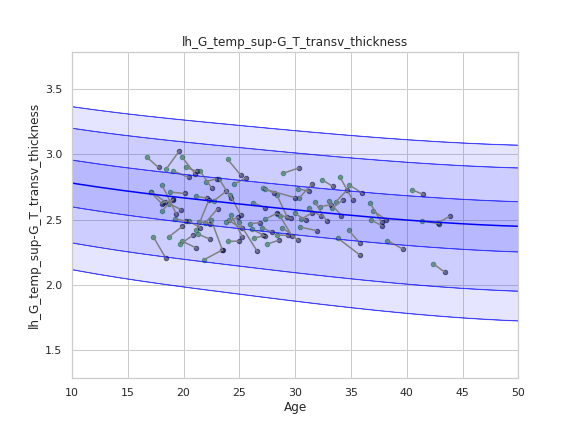

Running IDP 17 lh_G_front_inf-Orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21094881]), 'Rho': array([0.24237083]), 'pRho': array([0.0001453]), 'SMSE': array([1.13355627]), 'EXPV': array([0.03704808])}


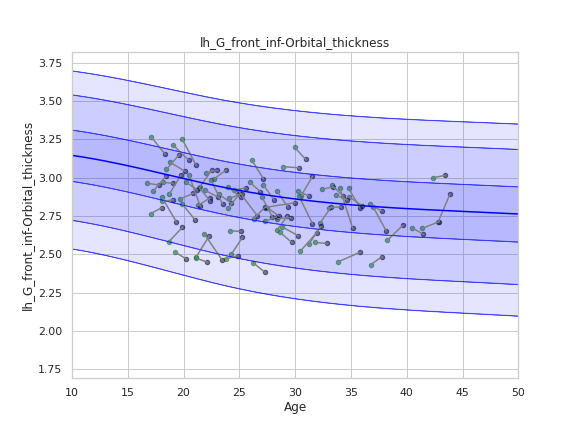

Running IDP 18 lh_G_pariet_inf-Angular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12425305]), 'Rho': array([0.33154617]), 'pRho': array([1.20129707e-07]), 'SMSE': array([0.91230909]), 'EXPV': array([0.10226298])}


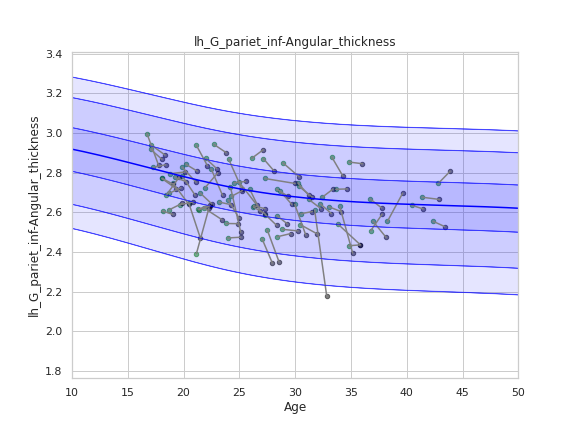

Running IDP 19 rh_G&S_subcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14115791]), 'Rho': array([0.31968358]), 'pRho': array([3.5911355e-07]), 'SMSE': array([0.95228126]), 'EXPV': array([0.09490747])}


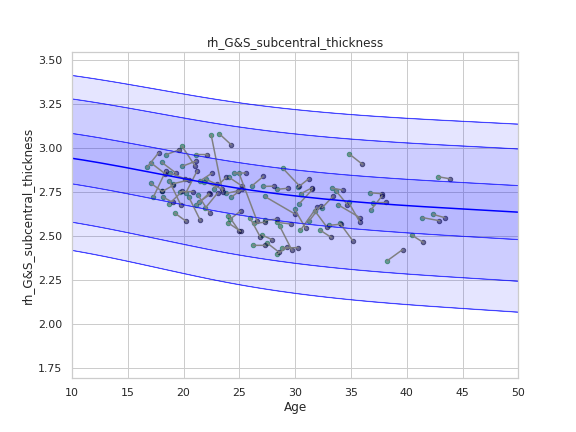

Running IDP 20 lh_S_cingul-Marginalis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10658673]), 'Rho': array([0.34697198]), 'pRho': array([2.68070184e-08]), 'SMSE': array([1.20554422]), 'EXPV': array([0.01551927])}


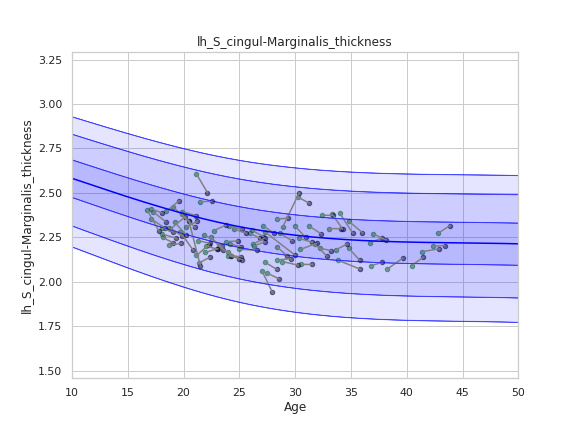

Running IDP 21 3rd-Ventricle :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([350.87576655]), 'Rho': array([0.30147775]), 'pRho': array([1.75391602e-06]), 'SMSE': array([1.0720063]), 'EXPV': array([0.09047449])}


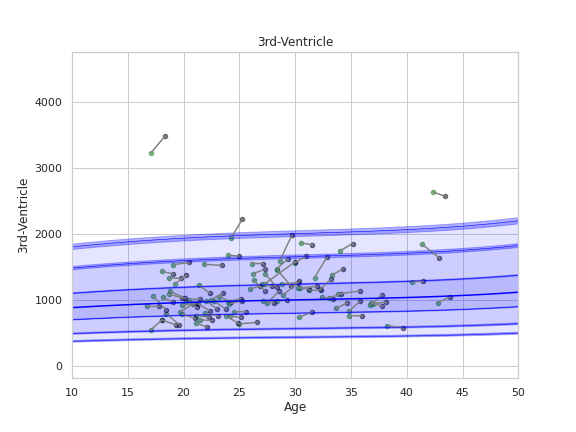

Running IDP 22 Right-Lateral-Ventricle :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([3178.6941367]), 'Rho': array([0.22961683]), 'pRho': array([0.00032882]), 'SMSE': array([1.01747288]), 'EXPV': array([0.05188052])}


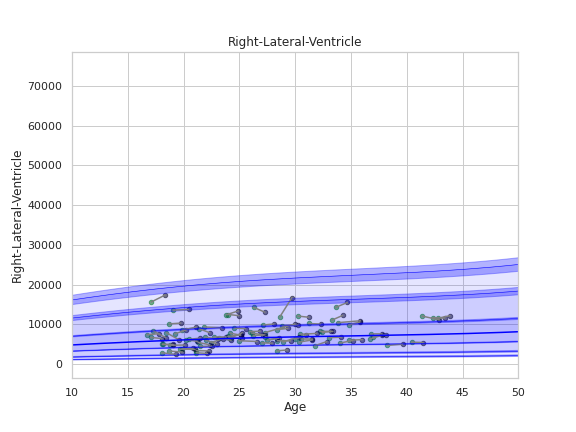

Running IDP 23 lh_G_oc-temp_med-Parahip_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1845891]), 'Rho': array([0.09063144]), 'pRho': array([0.16267303]), 'SMSE': array([0.99461916]), 'EXPV': array([0.00752002])}


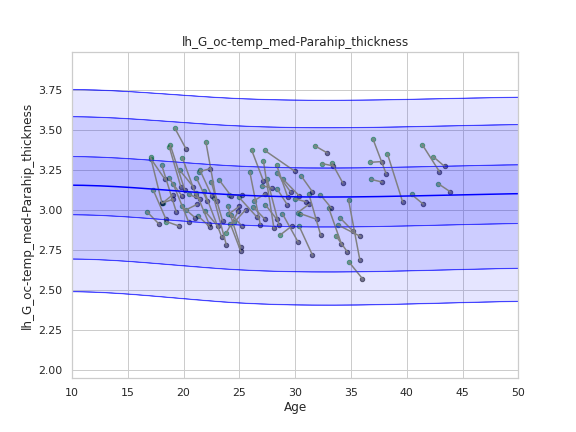

Running IDP 24 lh_S_temporal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10076831]), 'Rho': array([0.42262359]), 'pRho': array([4.31142493e-12]), 'SMSE': array([0.92199315]), 'EXPV': array([0.15823954])}


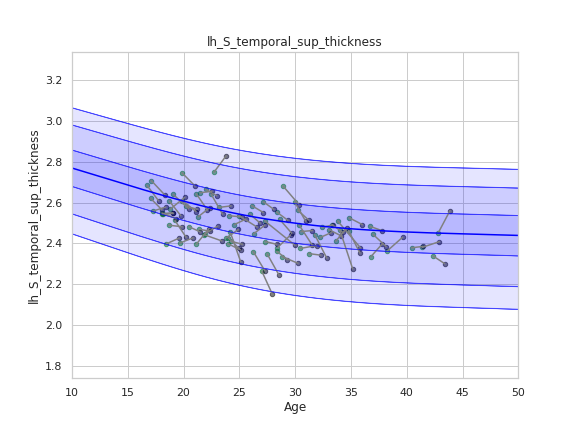

Running IDP 25 rh_G_precuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12092146]), 'Rho': array([0.31584932]), 'pRho': array([5.06258407e-07]), 'SMSE': array([1.03224845]), 'EXPV': array([0.06898016])}


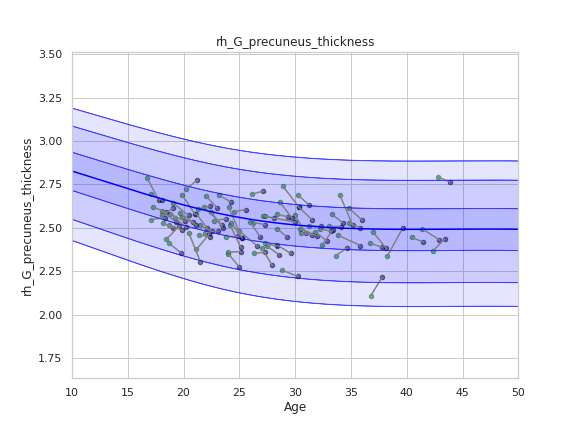

Running IDP 26 lh_S_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11403576]), 'Rho': array([0.26772341]), 'pRho': array([2.49154702e-05]), 'SMSE': array([0.95160833]), 'EXPV': array([0.05926405])}


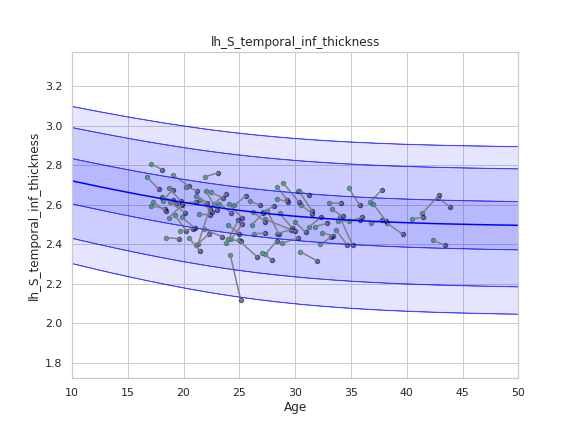

Running IDP 27 rh_G_orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11945051]), 'Rho': array([0.35487693]), 'pRho': array([1.20088412e-08]), 'SMSE': array([0.95267409]), 'EXPV': array([0.11058218])}


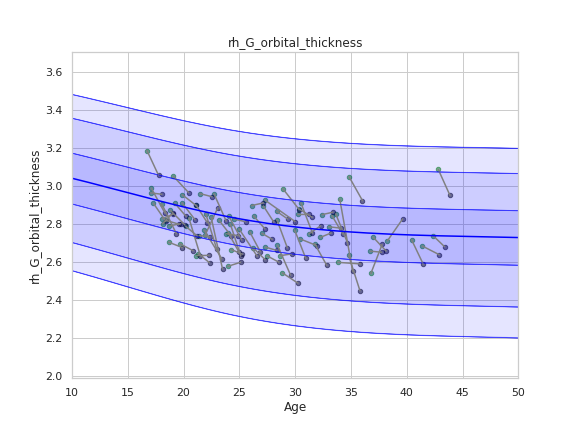

Running IDP 28 Right-choroid-plexus :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([133.2043483]), 'Rho': array([0.27532633]), 'pRho': array([1.41410512e-05]), 'SMSE': array([0.94286395]), 'EXPV': array([0.05985579])}


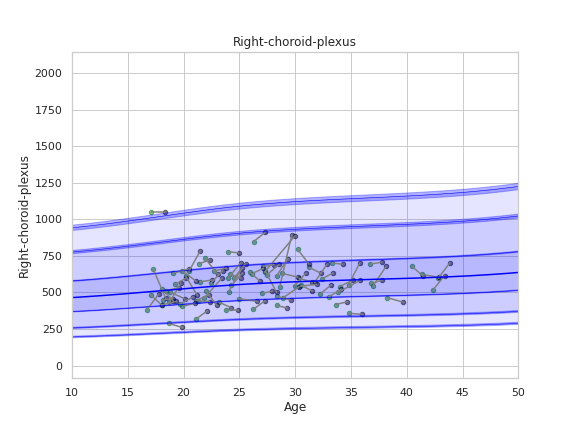

Running IDP 29 rh_G_cingul-Post-dorsal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1227127]), 'Rho': array([0.38682784]), 'pRho': array([3.63835803e-10]), 'SMSE': array([0.88407571]), 'EXPV': array([0.12683009])}


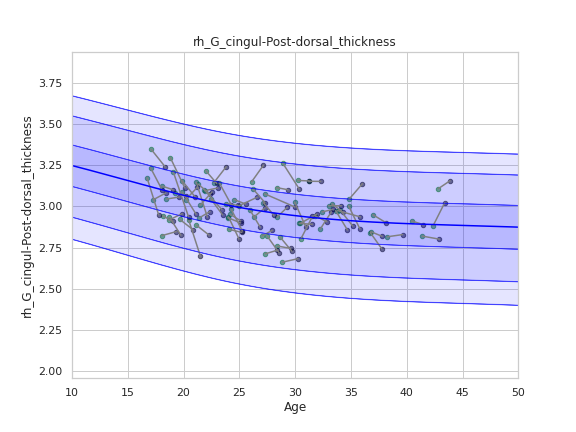

Running IDP 30 Right-Accumbens-area :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([79.39883033]), 'Rho': array([0.27664304]), 'pRho': array([1.27965813e-05]), 'SMSE': array([1.02568816]), 'EXPV': array([0.04655507])}


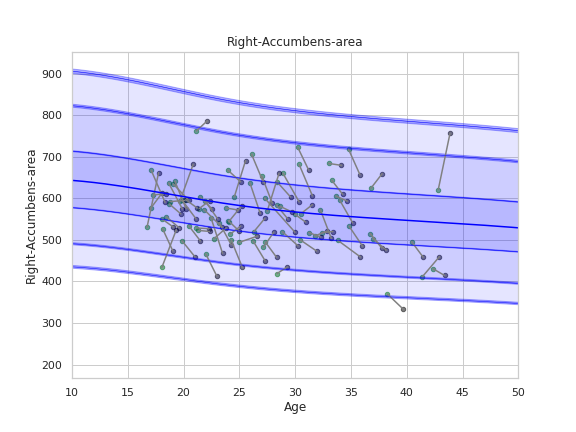

Running IDP 31 Right-vessel :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([21.93306077]), 'Rho': array([0.04957607]), 'pRho': array([0.44592456]), 'SMSE': array([1.06534271]), 'EXPV': array([0.0024275])}


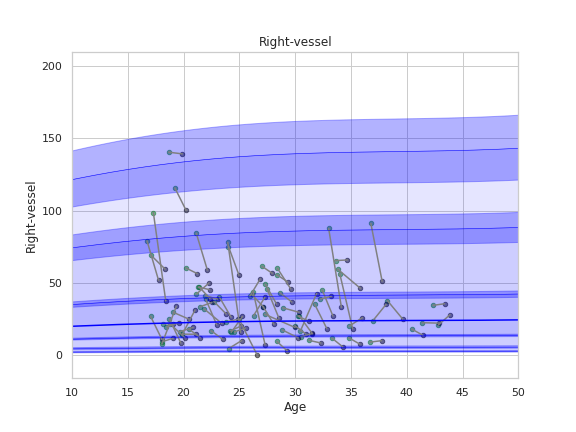

Running IDP 32 lh_S_oc_middle&Lunatus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12745623]), 'Rho': array([0.22995978]), 'pRho': array([0.00032187]), 'SMSE': array([0.96237914]), 'EXPV': array([0.05284916])}


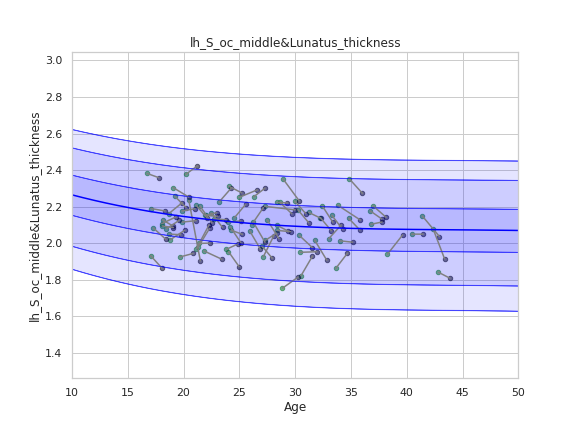

Running IDP 33 rh_Lat_Fis-ant-Vertical_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17148508]), 'Rho': array([0.30681429]), 'pRho': array([1.11469631e-06]), 'SMSE': array([1.04104979]), 'EXPV': array([0.09231332])}


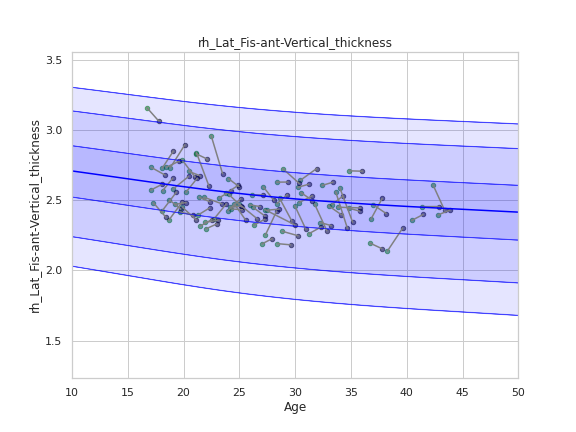

Running IDP 34 lh_Pole_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16934164]), 'Rho': array([0.20235051]), 'pRho': array([0.00162118]), 'SMSE': array([0.99640121]), 'EXPV': array([0.02996759])}


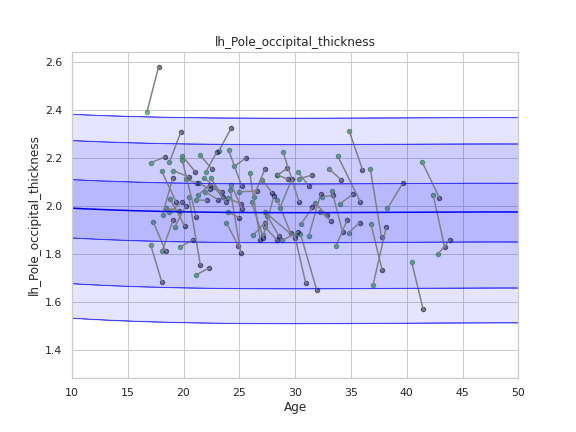

Running IDP 35 lh_Lat_Fis-ant-Horizont_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18714539]), 'Rho': array([0.22231712]), 'pRho': array([0.00051411]), 'SMSE': array([1.04918805]), 'EXPV': array([0.03870359])}


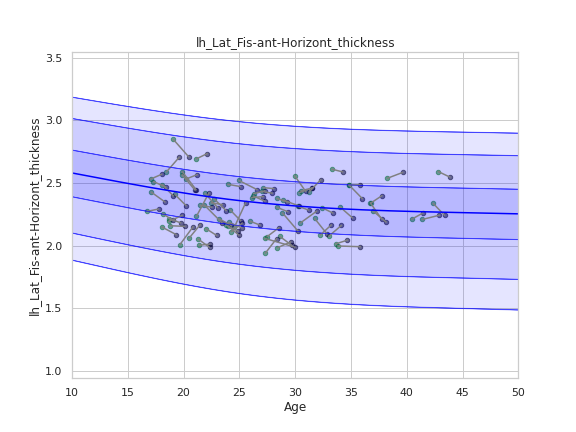

Running IDP 36 rh_G_subcallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18483252]), 'Rho': array([0.19434316]), 'pRho': array([0.00249441]), 'SMSE': array([1.06558245]), 'EXPV': array([0.03737766])}


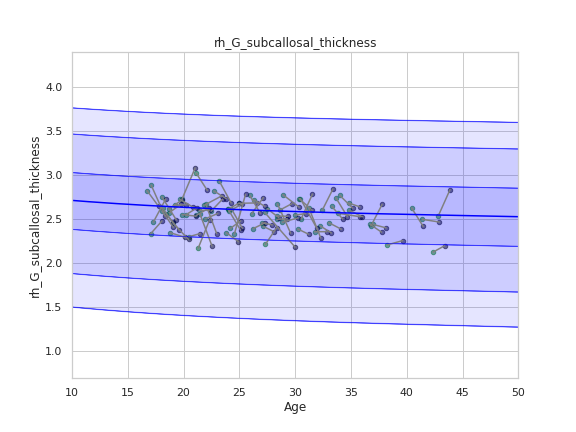

Running IDP 37 rh_S_interm_prim-Jensen_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.23387405]), 'Rho': array([0.15471842]), 'pRho': array([0.01657183]), 'SMSE': array([1.0250211]), 'EXPV': array([0.01998687])}


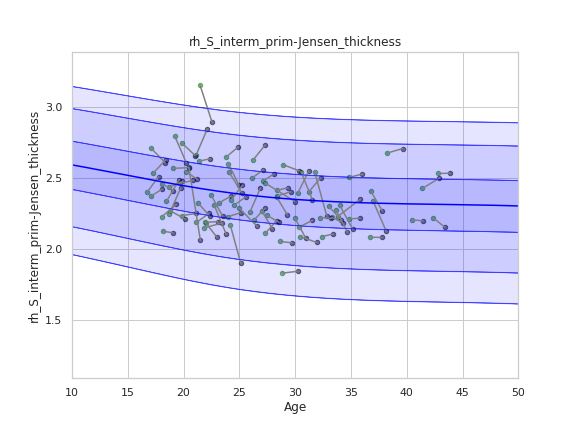

Running IDP 38 lh_G_insular_short_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19246433]), 'Rho': array([0.2049001]), 'pRho': array([0.00140837]), 'SMSE': array([0.99741426]), 'EXPV': array([0.03374856])}


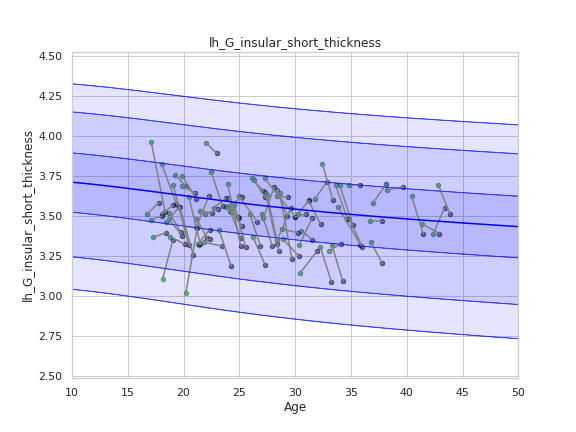

Running IDP 39 lh_G_temp_sup-Plan_polar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21404839]), 'Rho': array([0.33835392]), 'pRho': array([6.26395354e-08]), 'SMSE': array([0.97495661]), 'EXPV': array([0.09425615])}


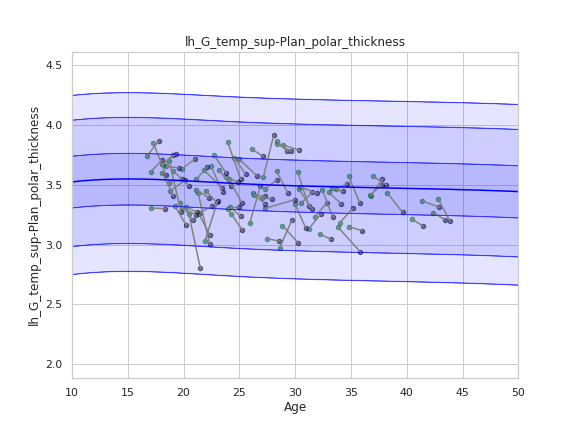

Running IDP 40 rh_S_oc-temp_med&Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11920925]), 'Rho': array([0.24211908]), 'pRho': array([0.00014773]), 'SMSE': array([1.12752578]), 'EXPV': array([0.03515257])}


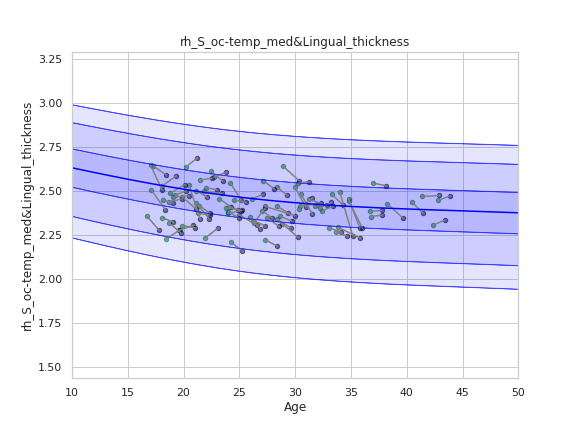

Running IDP 41 EstimatedTotalIntraCranialVol :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([125208.1115276]), 'Rho': array([0.58230776]), 'pRho': array([1.44803021e-24]), 'SMSE': array([0.66410066]), 'EXPV': array([0.33796381])}


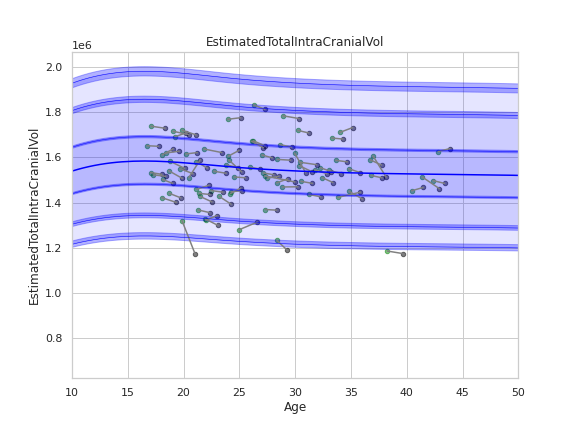

Running IDP 42 lh_S_orbital_med-olfact_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12805117]), 'Rho': array([0.32645124]), 'pRho': array([1.93445842e-07]), 'SMSE': array([0.91231128]), 'EXPV': array([0.10623912])}


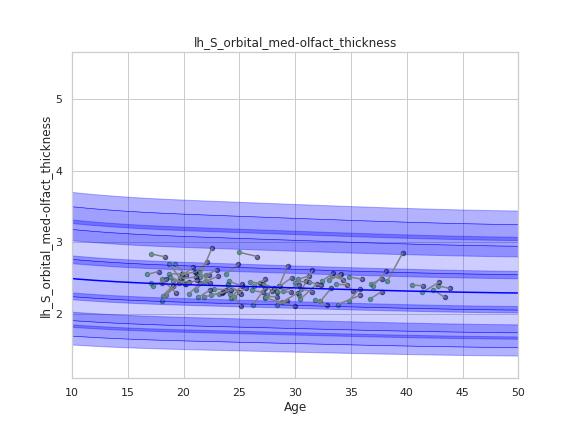

Running IDP 43 rh_G&S_occipital_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15584479]), 'Rho': array([0.27058359]), 'pRho': array([2.01759624e-05]), 'SMSE': array([0.96944616]), 'EXPV': array([0.06679033])}


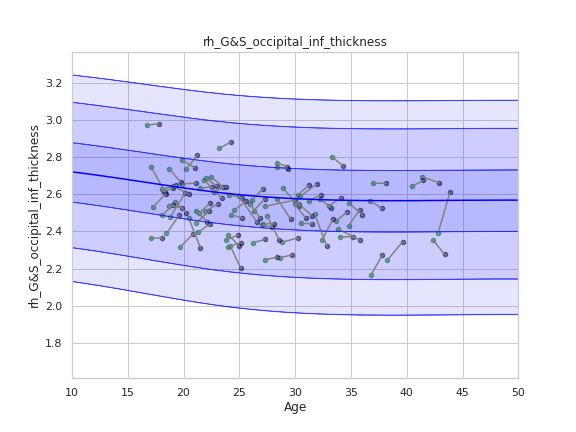

Running IDP 44 rh_G_occipital_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14124841]), 'Rho': array([0.23348016]), 'pRho': array([0.000258]), 'SMSE': array([0.9458926]), 'EXPV': array([0.05410792])}


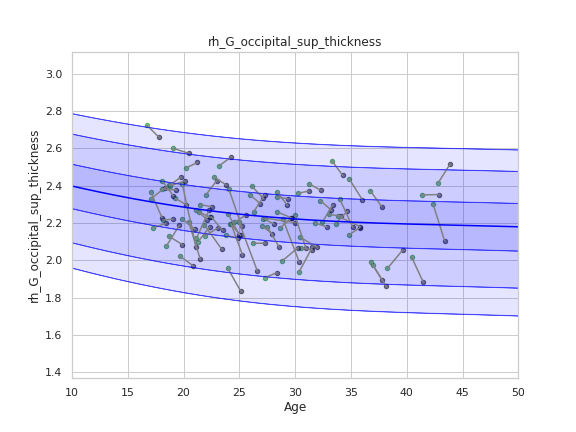

Running IDP 45 rh_G_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12324053]), 'Rho': array([0.35543492]), 'pRho': array([1.13368571e-08]), 'SMSE': array([1.08637595]), 'EXPV': array([0.09033418])}


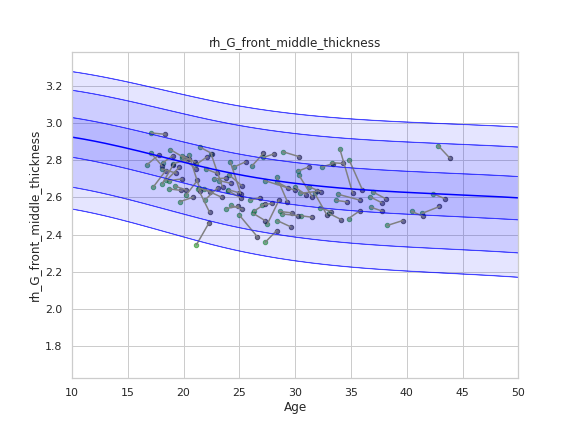

Running IDP 46 rh_S_circular_insula_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12294665]), 'Rho': array([0.44971092]), 'pRho': array([1.00275023e-13]), 'SMSE': array([1.34135337]), 'EXPV': array([0.14115919])}


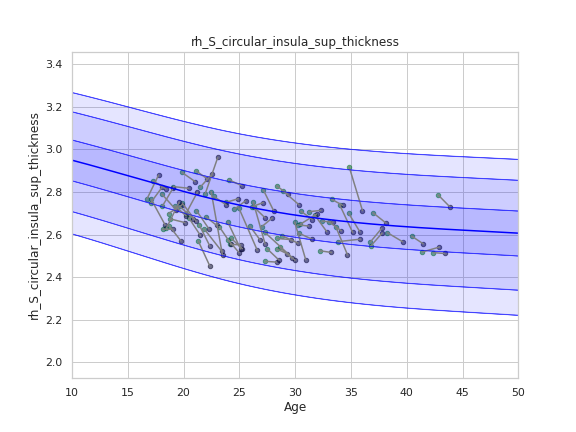

Running IDP 47 rh_G&S_cingul-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1189509]), 'Rho': array([0.3032322]), 'pRho': array([1.51267726e-06]), 'SMSE': array([1.07799214]), 'EXPV': array([0.0324936])}


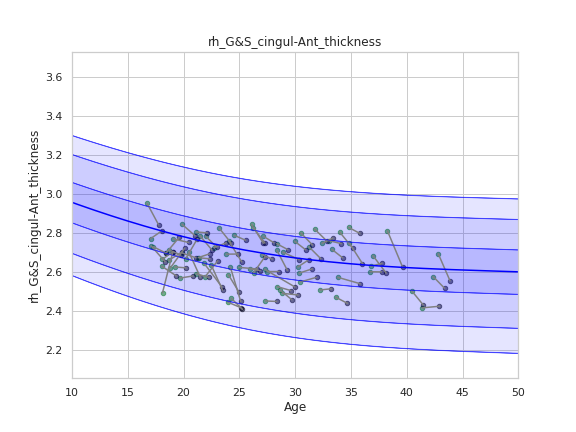

Running IDP 48 lh_G_temp_sup-Plan_tempo_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14715704]), 'Rho': array([0.21873044]), 'pRho': array([0.00063693]), 'SMSE': array([1.00825941]), 'EXPV': array([0.03199128])}


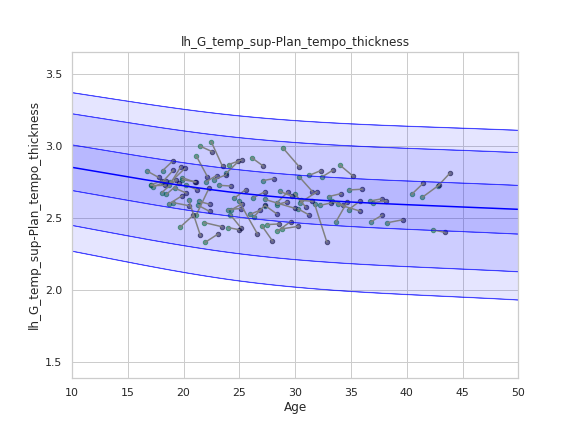

Running IDP 49 Left-Cerebellum-White-Matter :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([1865.44667784]), 'Rho': array([0.39370381]), 'pRho': array([1.62223359e-10]), 'SMSE': array([0.86931301]), 'EXPV': array([0.13329152])}


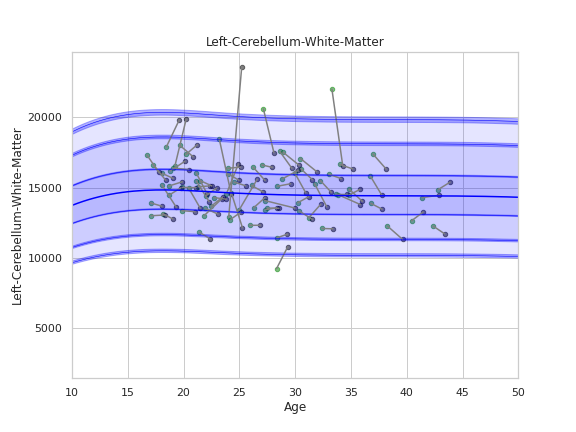

Running IDP 50 lh_S_circular_insula_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11859003]), 'Rho': array([0.45132859]), 'pRho': array([7.9153949e-14]), 'SMSE': array([1.09149202]), 'EXPV': array([0.18035322])}


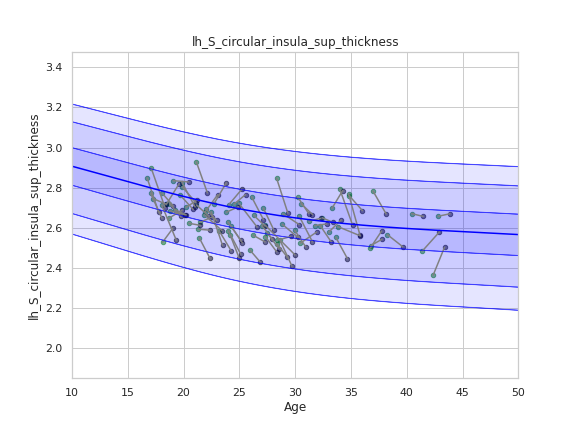

Running IDP 51 SupraTentorialVolNotVent :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([90126.14203544]), 'Rho': array([0.52578633]), 'pRho': array([2.80172455e-19]), 'SMSE': array([0.76448904]), 'EXPV': array([0.27406295])}


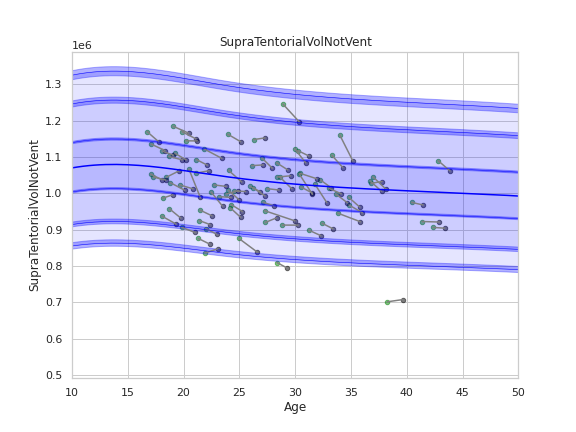

Running IDP 52 Left-Cerebellum-Cortex :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([4757.38056812]), 'Rho': array([0.54783106]), 'pRho': array([3.32210926e-21]), 'SMSE': array([0.7247981]), 'EXPV': array([0.29869083])}


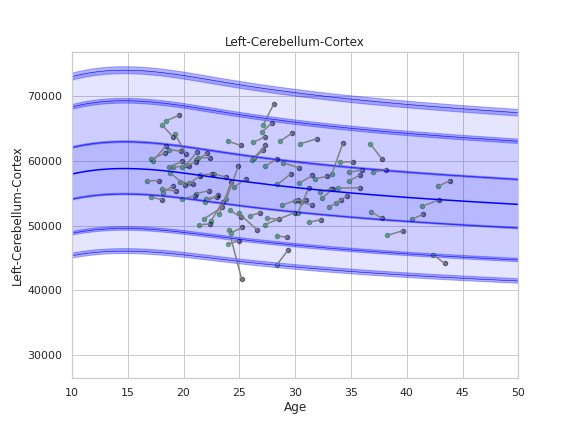

Running IDP 53 lh_G_front_inf-Opercular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14814895]), 'Rho': array([0.44015725]), 'pRho': array([3.94183904e-13]), 'SMSE': array([1.12601396]), 'EXPV': array([0.18967377])}


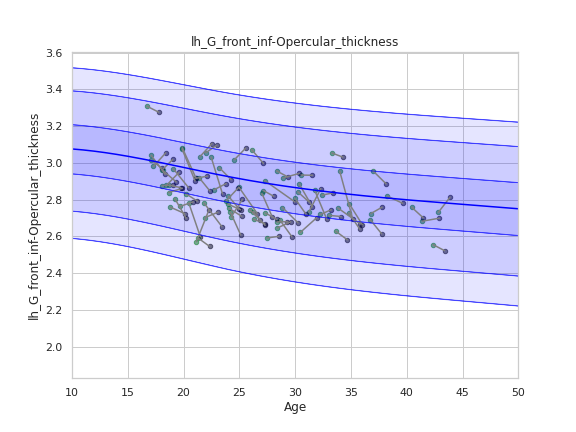

Running IDP 54 rh_G_cingul-Post-ventral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21103706]), 'Rho': array([0.22570369]), 'pRho': array([0.0004186]), 'SMSE': array([0.99602566]), 'EXPV': array([0.03590133])}


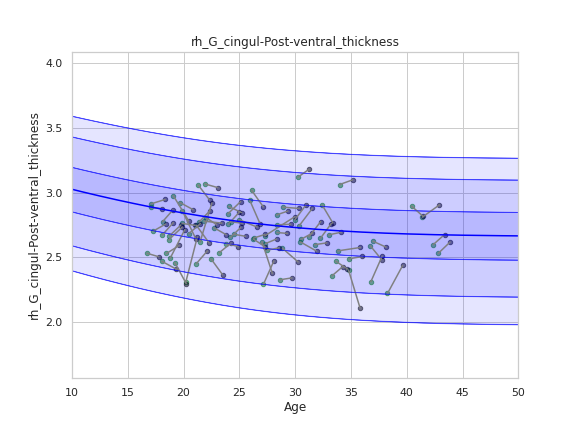

Running IDP 55 lh_Lat_Fis-ant-Vertical_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1973143]), 'Rho': array([0.30069722]), 'pRho': array([1.8726469e-06]), 'SMSE': array([0.93329267]), 'EXPV': array([0.09039496])}


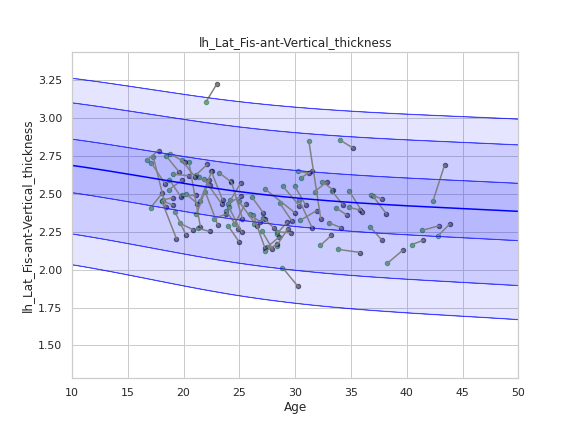

Running IDP 56 rh_S_central_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.09901211]), 'Rho': array([0.07706319]), 'pRho': array([0.23553575]), 'SMSE': array([1.1250601]), 'EXPV': array([-0.01310543])}


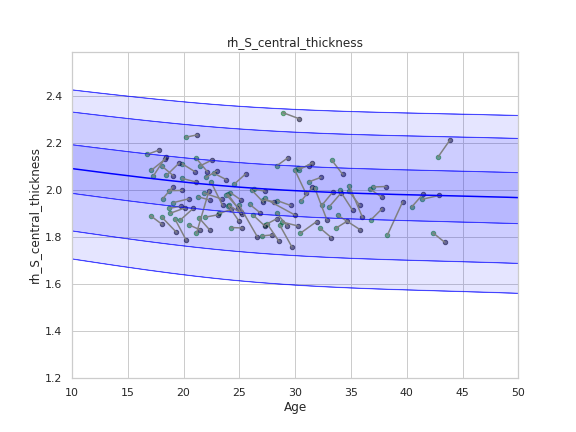

Running IDP 57 Right-Cerebellum-White-Matter :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([1732.0211275]), 'Rho': array([0.39218732]), 'pRho': array([1.94195893e-10]), 'SMSE': array([0.86998102]), 'EXPV': array([0.13143712])}


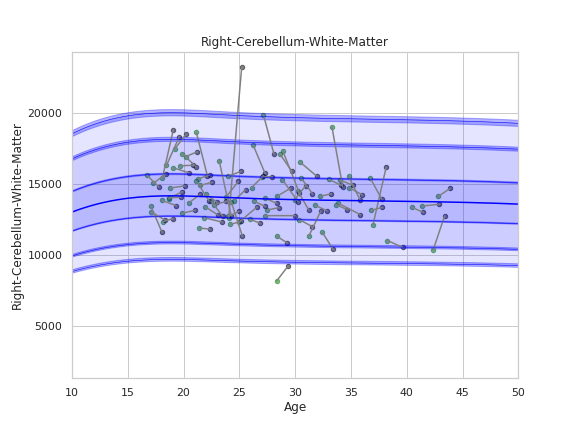

Running IDP 58 rh_Lat_Fis-ant-Horizont_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18095057]), 'Rho': array([0.11112947]), 'pRho': array([0.08647664]), 'SMSE': array([1.13774233]), 'EXPV': array([-0.05312554])}


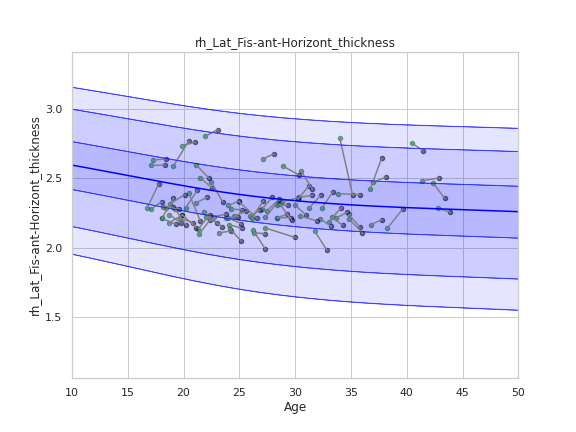

Running IDP 59 rh_G_oc-temp_lat-fusifor_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1323269]), 'Rho': array([0.18939876]), 'pRho': array([0.00322789]), 'SMSE': array([0.99830425]), 'EXPV': array([0.03037875])}


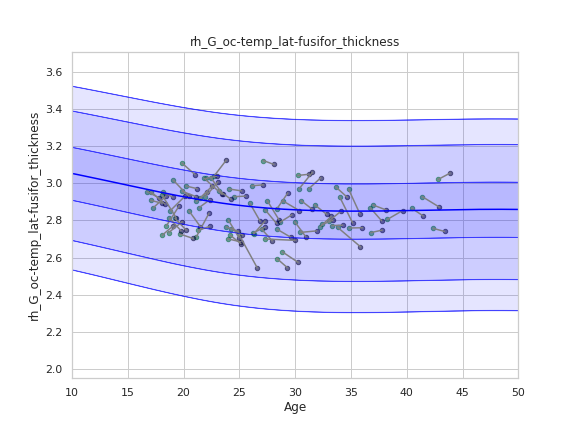

Running IDP 60 lh_G_precentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19321187]), 'Rho': array([0.14573062]), 'pRho': array([0.02414527]), 'SMSE': array([1.10326848]), 'EXPV': array([0.01748513])}


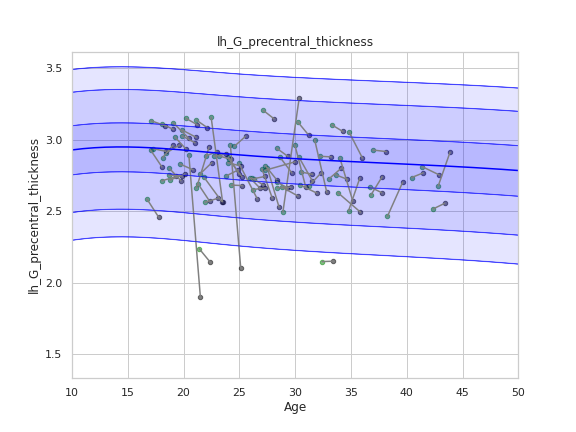

Running IDP 61 rh_S_oc_middle&Lunatus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11641454]), 'Rho': array([0.20783741]), 'pRho': array([0.00119504]), 'SMSE': array([1.02082304]), 'EXPV': array([0.0371733])}


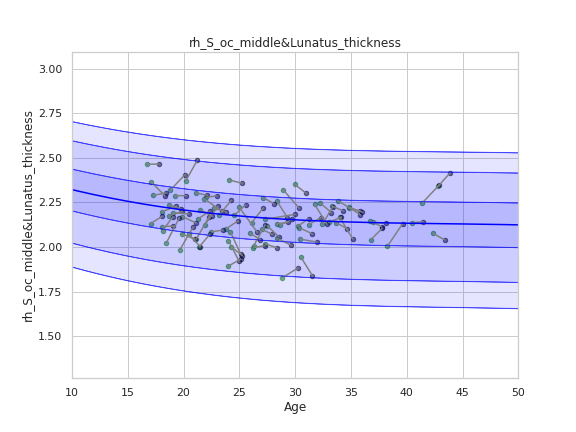

Running IDP 62 rh_S_circular_insula_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15733485]), 'Rho': array([0.36884117]), 'pRho': array([2.74015014e-09]), 'SMSE': array([1.0498852]), 'EXPV': array([0.12492925])}


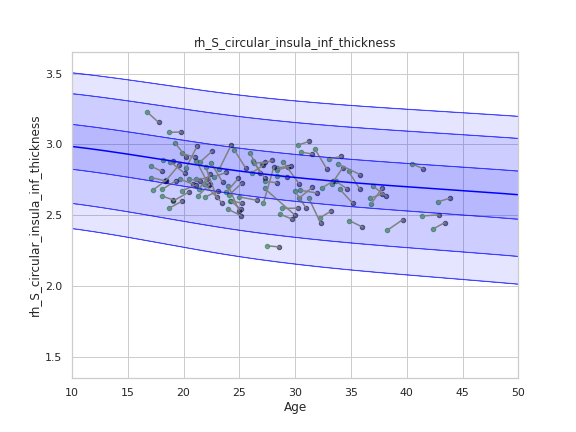

Running IDP 63 rh_G_temp_sup-Lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1618282]), 'Rho': array([0.2430817]), 'pRho': array([0.00013865]), 'SMSE': array([0.98440101]), 'EXPV': array([0.0526259])}


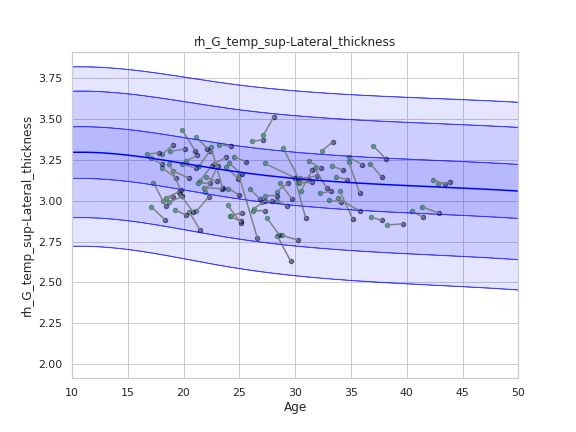

Running IDP 64 Right-Amygdala :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([181.26621518]), 'Rho': array([0.39229195]), 'pRho': array([1.91806605e-10]), 'SMSE': array([0.87603811]), 'EXPV': array([0.14027178])}


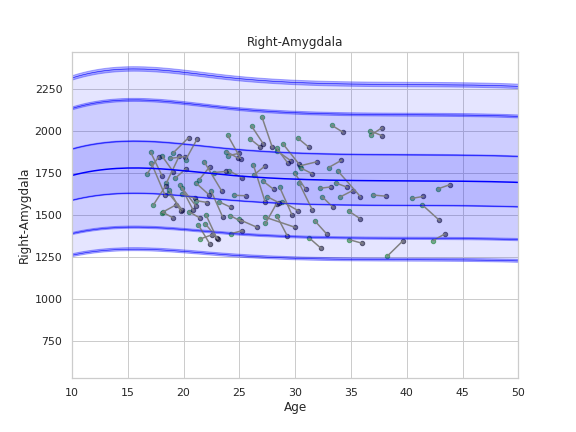

Running IDP 65 lh_S_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10561405]), 'Rho': array([0.22863205]), 'pRho': array([0.00034955]), 'SMSE': array([1.07827061]), 'EXPV': array([-0.03905233])}


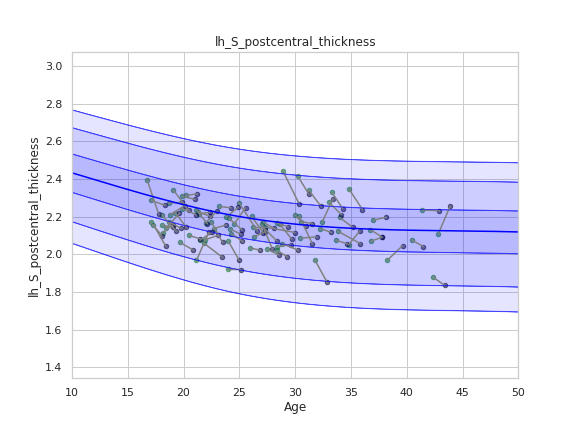

Running IDP 66 SubCortGrayVol :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([4718.37554815]), 'Rho': array([0.48853448]), 'pRho': array([2.29602872e-16]), 'SMSE': array([0.78087166]), 'EXPV': array([0.23566947])}


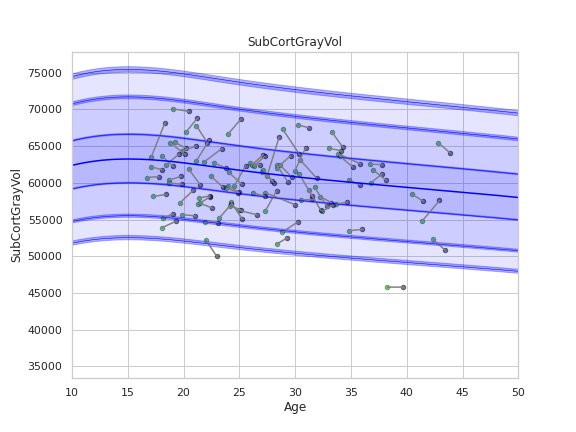

Running IDP 67 rh_S_intrapariet&P_trans_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.09820172]), 'Rho': array([0.24415146]), 'pRho': array([0.00012917]), 'SMSE': array([1.21580717]), 'EXPV': array([-0.03436618])}


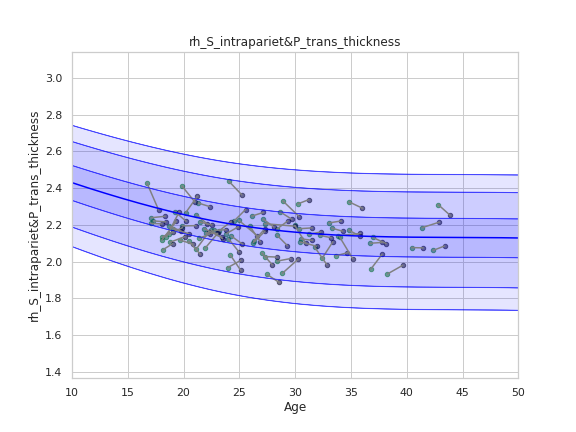

Running IDP 68 Left-choroid-plexus :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([137.88004614]), 'Rho': array([0.27347457]), 'pRho': array([1.62594417e-05]), 'SMSE': array([0.96296034]), 'EXPV': array([0.06906354])}


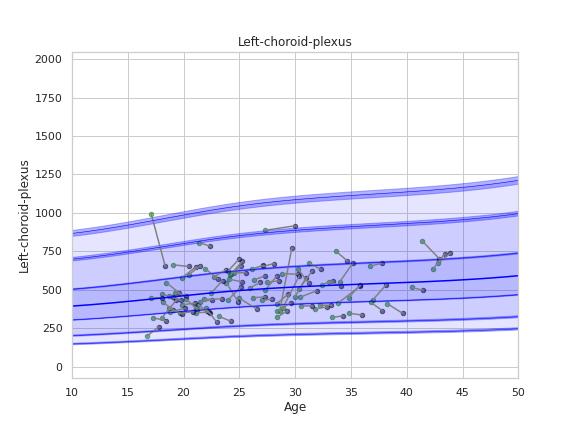

Running IDP 69 rh_G_front_inf-Opercular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13420798]), 'Rho': array([0.40499876]), 'pRho': array([4.11554121e-11]), 'SMSE': array([1.07453023]), 'EXPV': array([0.145306])}


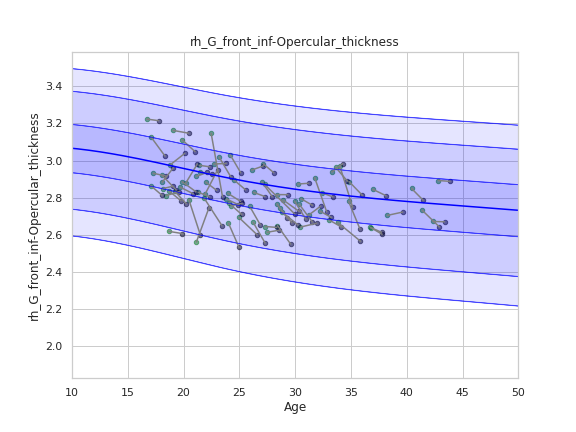

Running IDP 70 rh_S_oc-temp_lat_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14467773]), 'Rho': array([0.212209]), 'pRho': array([0.0009319]), 'SMSE': array([1.19948557]), 'EXPV': array([0.03457253])}


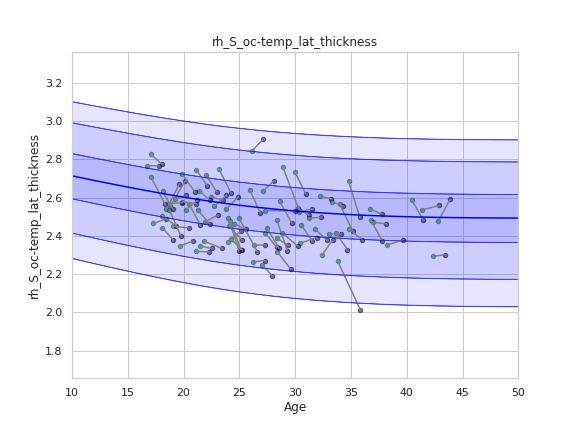

Running IDP 71 CSF :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([209.86432755]), 'Rho': array([0.24936217]), 'pRho': array([9.1052364e-05]), 'SMSE': array([1.00715526]), 'EXPV': array([0.06181986])}


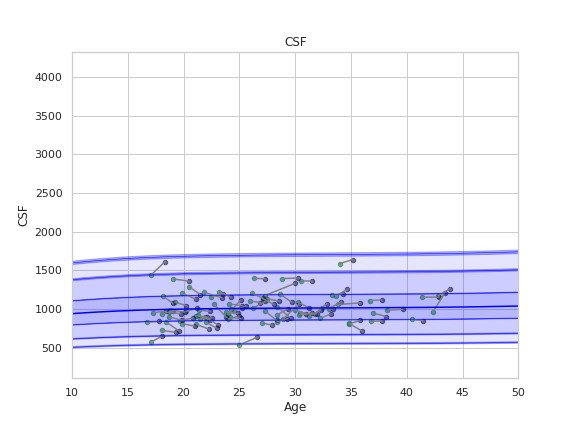

Running IDP 72 TotalGrayVol :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([55110.58950084]), 'Rho': array([0.62918315]), 'pRho': array([5.9625173e-30]), 'SMSE': array([0.66025652]), 'EXPV': array([0.39382577])}


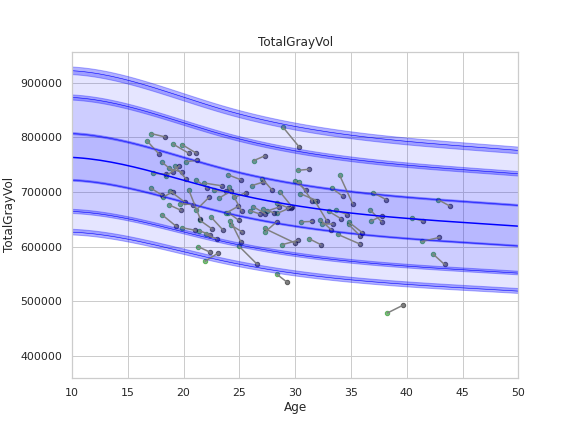

Running IDP 73 lh_S_central_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.09230148]), 'Rho': array([0.07308489]), 'pRho': array([0.26069207]), 'SMSE': array([1.12149499]), 'EXPV': array([-0.0273115])}


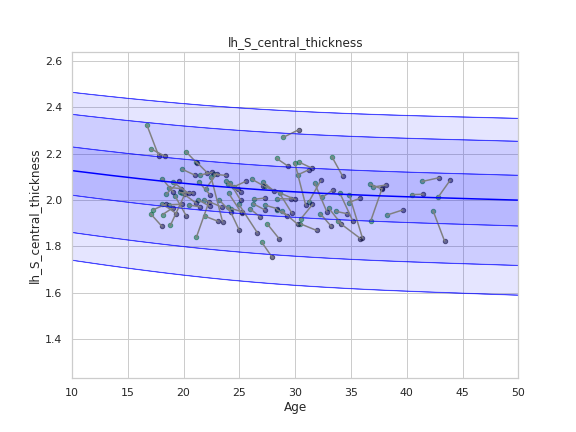

Running IDP 74 rh_G_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13184685]), 'Rho': array([0.34900046]), 'pRho': array([2.18644657e-08]), 'SMSE': array([1.16510438]), 'EXPV': array([0.06575659])}


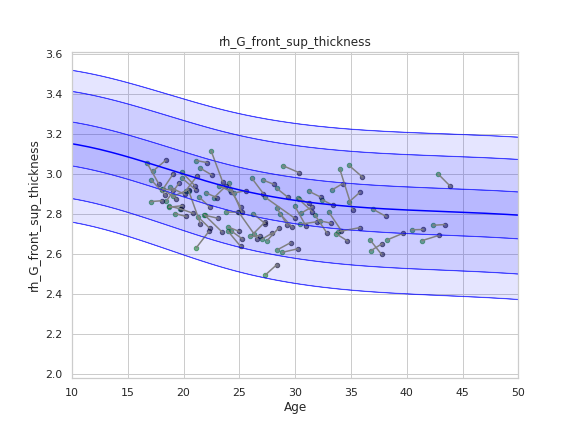

Running IDP 75 rh_S_collat_transv_post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13439256]), 'Rho': array([0.31311755]), 'pRho': array([6.4459546e-07]), 'SMSE': array([1.03990826]), 'EXPV': array([0.09512339])}


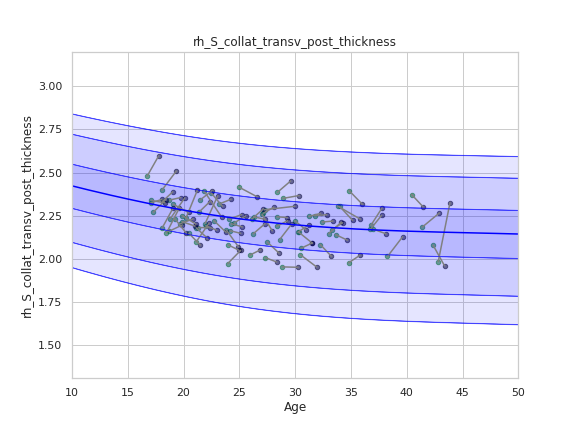

Running IDP 76 lh_G&S_transv_frontopol_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12148977]), 'Rho': array([0.2772191]), 'pRho': array([1.22472397e-05]), 'SMSE': array([0.99695516]), 'EXPV': array([0.03587916])}


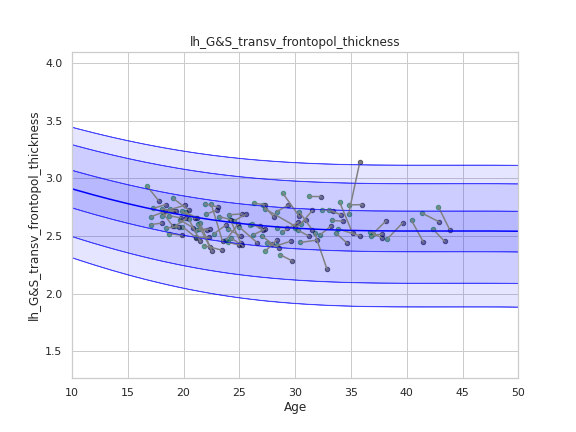

Running IDP 77 Right-Hippocampus :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([383.8778104]), 'Rho': array([0.29192955]), 'pRho': array([3.85508382e-06]), 'SMSE': array([0.97051531]), 'EXPV': array([0.07746014])}


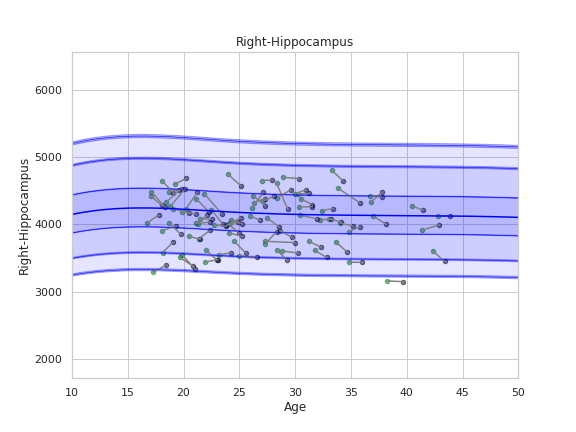

Running IDP 78 4th-Ventricle :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([673.00195392]), 'Rho': array([0.25912578]), 'pRho': array([4.62850518e-05]), 'SMSE': array([1.04933338]), 'EXPV': array([0.06421968])}


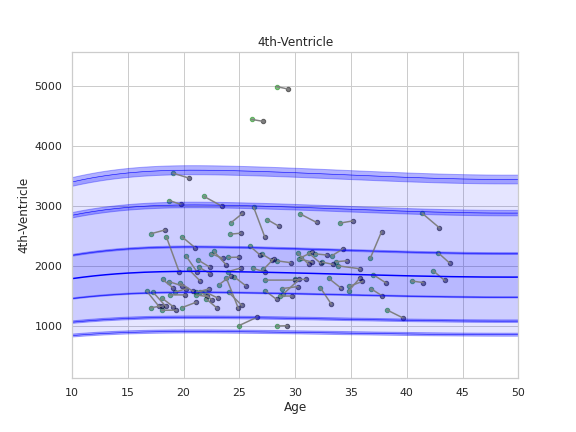

Running IDP 79 lh_G_cuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13237551]), 'Rho': array([0.12909796]), 'pRho': array([0.04611167]), 'SMSE': array([1.02518508]), 'EXPV': array([0.00097427])}


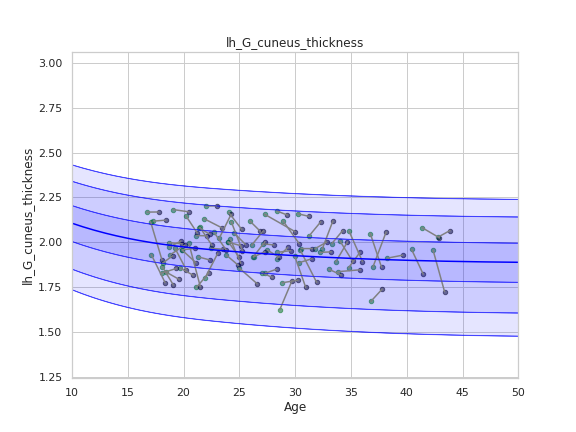

Running IDP 80 lh_G&S_cingul-Mid-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13321413]), 'Rho': array([0.35812944]), 'pRho': array([8.57021889e-09]), 'SMSE': array([1.1736397]), 'EXPV': array([0.08067822])}


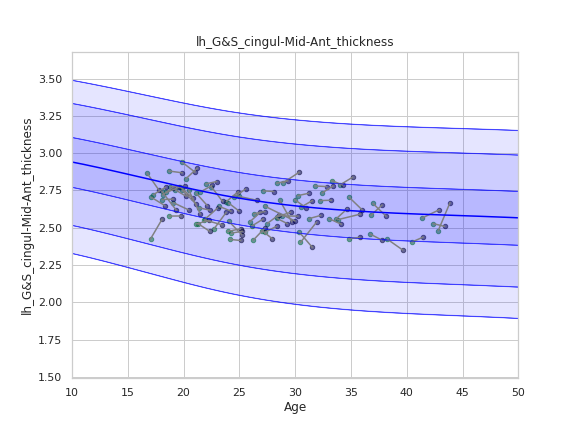

Running IDP 81 rh_G&S_cingul-Mid-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13723438]), 'Rho': array([0.30282687]), 'pRho': array([1.56542514e-06]), 'SMSE': array([1.11269]), 'EXPV': array([0.05188784])}


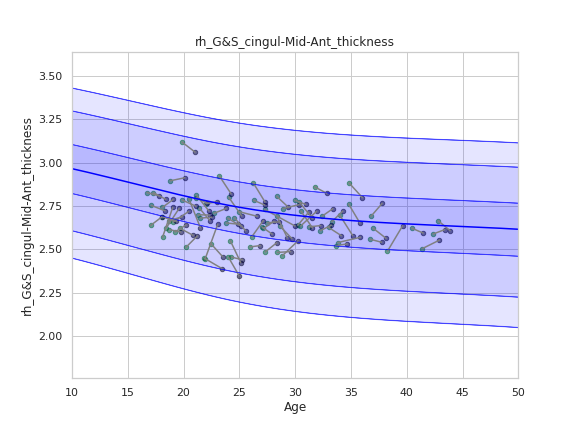

Running IDP 82 Right-Pallidum :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([231.51851888]), 'Rho': array([0.3818448]), 'pRho': array([6.45156328e-10]), 'SMSE': array([0.88331028]), 'EXPV': array([0.14520365])}


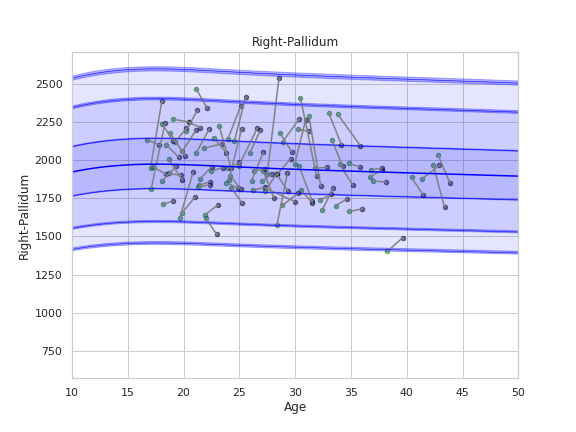

Running IDP 83 lh_G&S_subcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14152255]), 'Rho': array([0.31703678]), 'pRho': array([4.55428079e-07]), 'SMSE': array([0.95933003]), 'EXPV': array([0.09459592])}


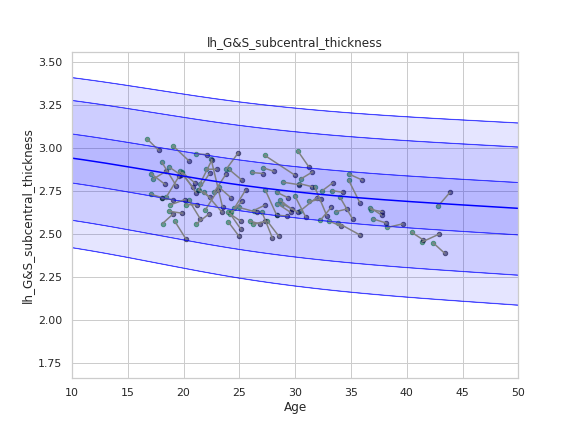

Running IDP 84 lh_S_oc-temp_lat_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12468958]), 'Rho': array([0.28349647]), 'pRho': array([7.54157572e-06]), 'SMSE': array([0.97922394]), 'EXPV': array([0.07838397])}


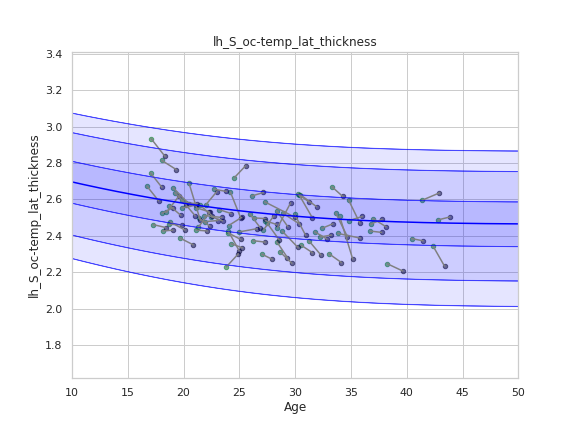

Running IDP 85 rh_S_precentral-sup-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13183556]), 'Rho': array([0.08909283]), 'pRho': array([0.16996738]), 'SMSE': array([1.27901665]), 'EXPV': array([-0.11282974])}


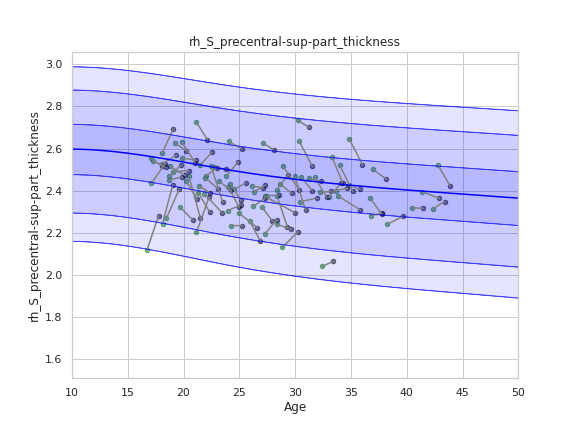

Running IDP 86 lh_G_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11511524]), 'Rho': array([0.33364883]), 'pRho': array([9.84196615e-08]), 'SMSE': array([0.98127909]), 'EXPV': array([0.06222266])}


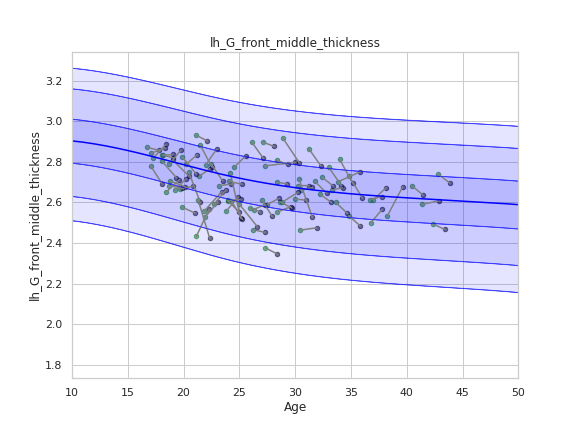

Running IDP 87 lh_G_occipital_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12722893]), 'Rho': array([0.31941659]), 'pRho': array([3.67865212e-07]), 'SMSE': array([0.90493964]), 'EXPV': array([0.09525355])}


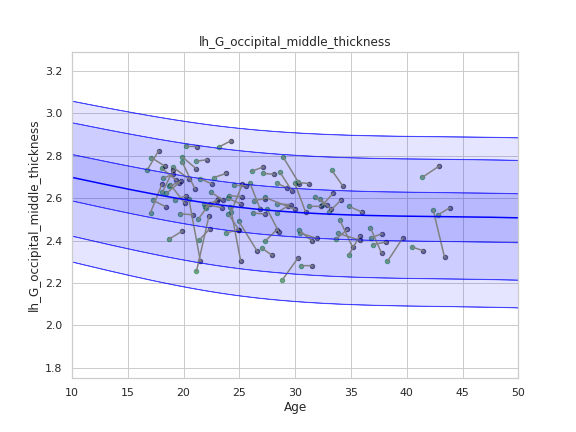

Running IDP 88 rh_G_front_inf-Triangul_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14763688]), 'Rho': array([0.33668036]), 'pRho': array([7.36288828e-08]), 'SMSE': array([1.08932673]), 'EXPV': array([0.07478401])}


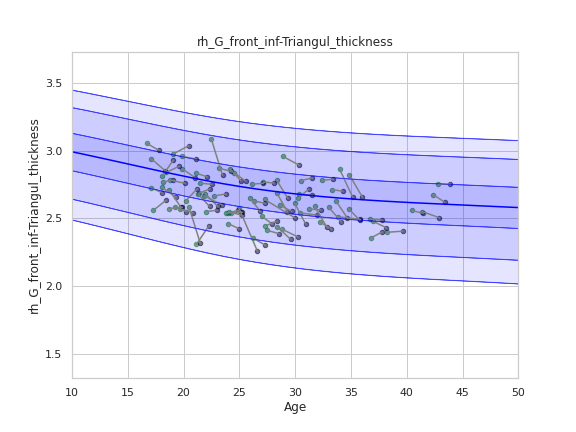

Running IDP 89 Right-Cerebellum-Cortex :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([4871.00388512]), 'Rho': array([0.58434655]), 'pRho': array([8.85894706e-25]), 'SMSE': array([0.673942]), 'EXPV': array([0.3413902])}


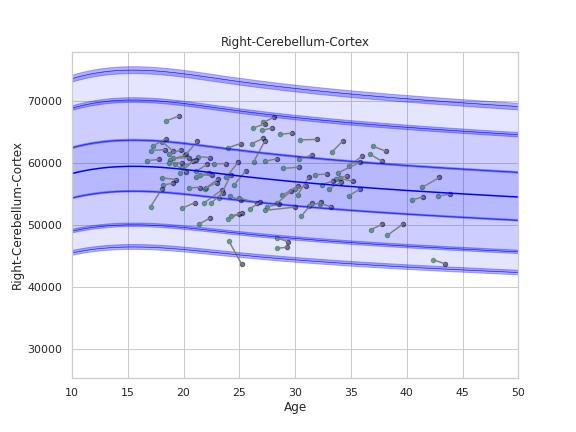

Running IDP 90 lh_G_subcallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16895604]), 'Rho': array([0.20825109]), 'pRho': array([0.0011675]), 'SMSE': array([0.97126228]), 'EXPV': array([0.04191495])}


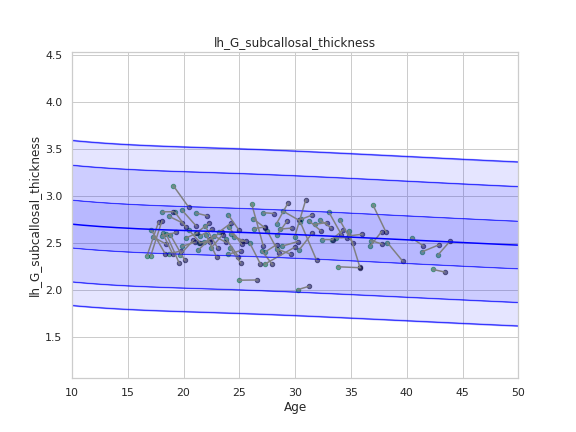

Running IDP 91 lh_G_rectus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12827924]), 'Rho': array([0.32112912]), 'pRho': array([3.15086738e-07]), 'SMSE': array([0.92035328]), 'EXPV': array([0.10263161])}


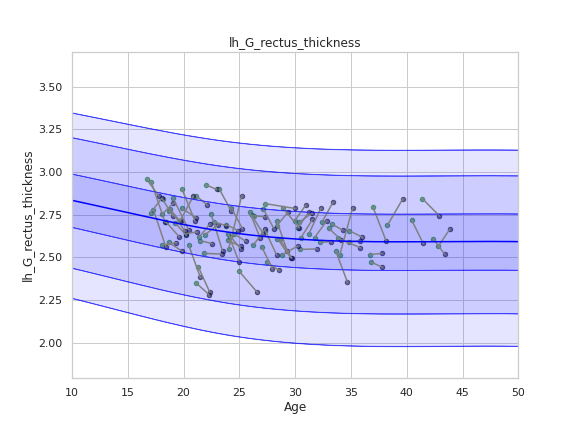

Running IDP 92 lh_G_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14813167]), 'Rho': array([0.08985059]), 'pRho': array([0.16634514]), 'SMSE': array([1.01783461]), 'EXPV': array([-0.0088155])}


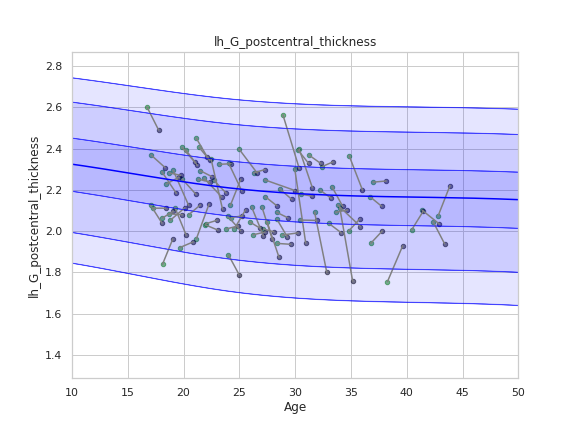

Running IDP 93 rh_G_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1297295]), 'Rho': array([0.12800484]), 'pRho': array([0.04800832]), 'SMSE': array([1.05702441]), 'EXPV': array([0.00099754])}


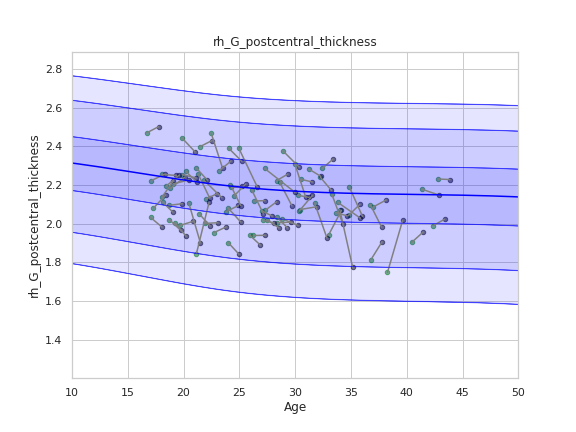

Running IDP 94 rh_S_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11212166]), 'Rho': array([0.27001592]), 'pRho': array([2.10430034e-05]), 'SMSE': array([1.12111013]), 'EXPV': array([0.03015194])}


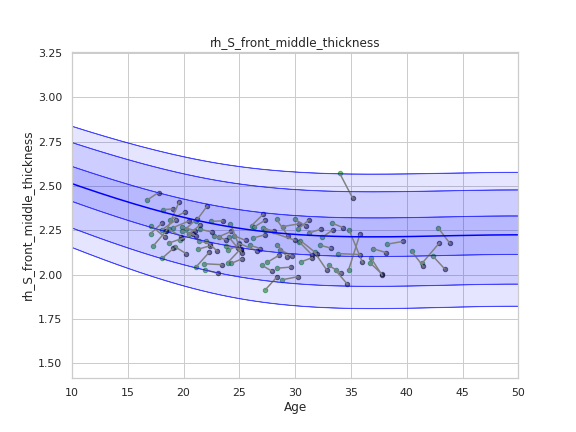

Running IDP 95 lh_G&S_cingul-Mid-Post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12196216]), 'Rho': array([0.27992859]), 'pRho': array([9.94961168e-06]), 'SMSE': array([1.31652868]), 'EXPV': array([-0.09115929])}


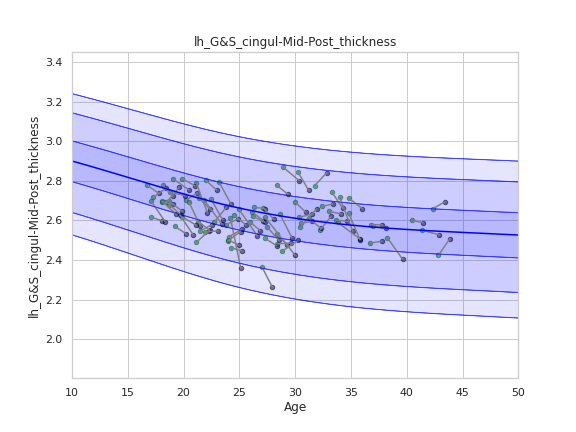

Running IDP 96 Left-Accumbens-area :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([73.68308966]), 'Rho': array([0.31328269]), 'pRho': array([6.3529653e-07]), 'SMSE': array([0.94387512]), 'EXPV': array([0.08741704])}


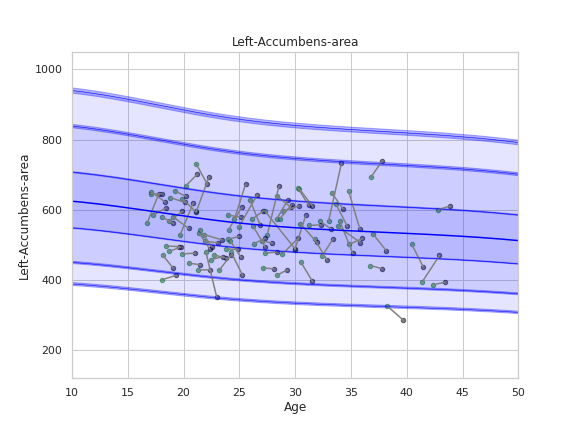

Running IDP 97 lh_G_temporal_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13526506]), 'Rho': array([0.36676767]), 'pRho': array([3.42906004e-09]), 'SMSE': array([0.87723495]), 'EXPV': array([0.1345182])}


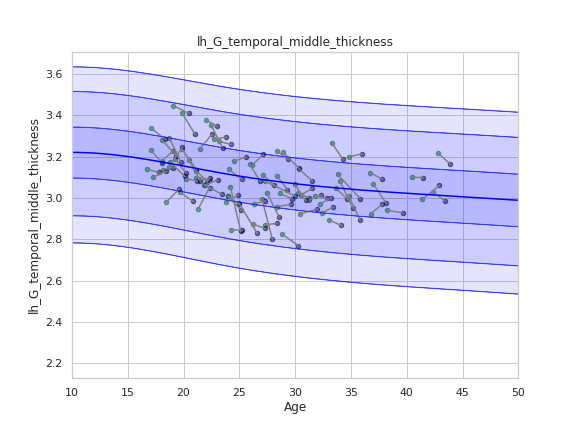

Running IDP 98 lh_G_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14248136]), 'Rho': array([0.37234029]), 'pRho': array([1.8694111e-09]), 'SMSE': array([0.89251334]), 'EXPV': array([0.1239188])}


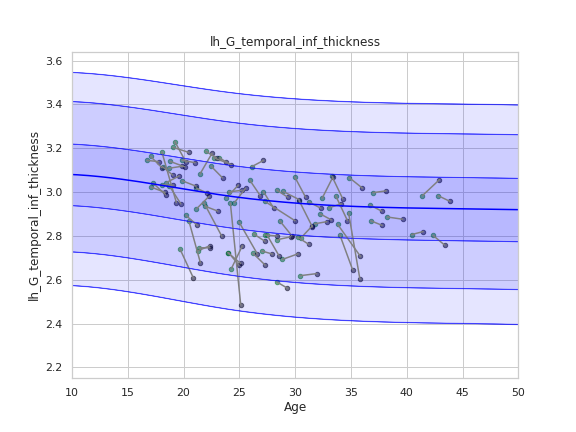

Running IDP 99 rh_G_parietal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11305566]), 'Rho': array([0.24690723]), 'pRho': array([0.00010746]), 'SMSE': array([1.09066127]), 'EXPV': array([0.00942195])}


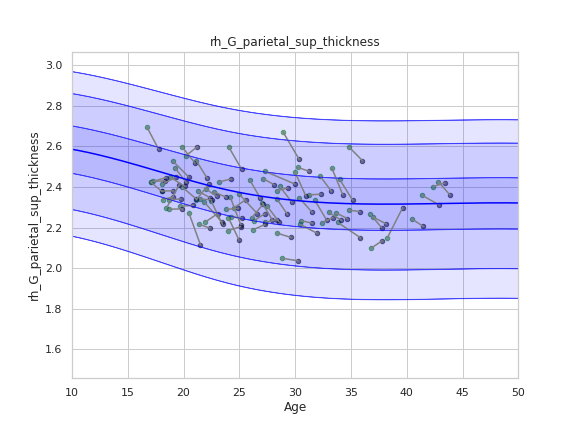

Running IDP 100 rh_G_temp_sup-G_T_transv_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18980861]), 'Rho': array([0.20791058]), 'pRho': array([0.00119012]), 'SMSE': array([1.00660214]), 'EXPV': array([0.03493675])}


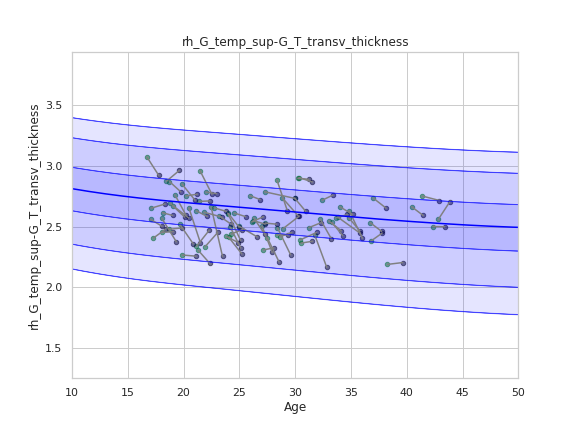

Running IDP 101 lh_S_parieto_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10886537]), 'Rho': array([0.21350325]), 'pRho': array([0.0008649]), 'SMSE': array([1.13105741]), 'EXPV': array([-0.04350851])}


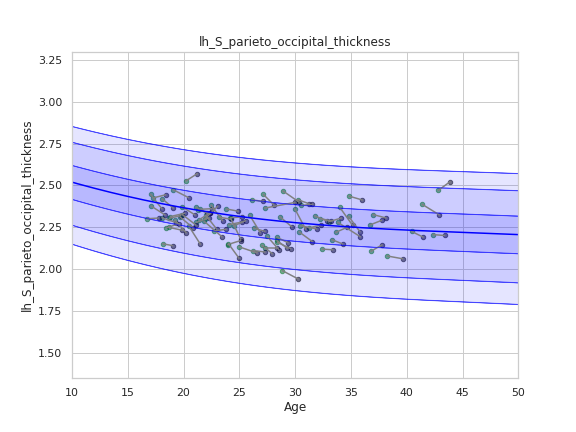

Running IDP 102 rh_S_calcarine_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11499785]), 'Rho': array([0.29262473]), 'pRho': array([3.64391091e-06]), 'SMSE': array([0.95765433]), 'EXPV': array([0.0753012])}


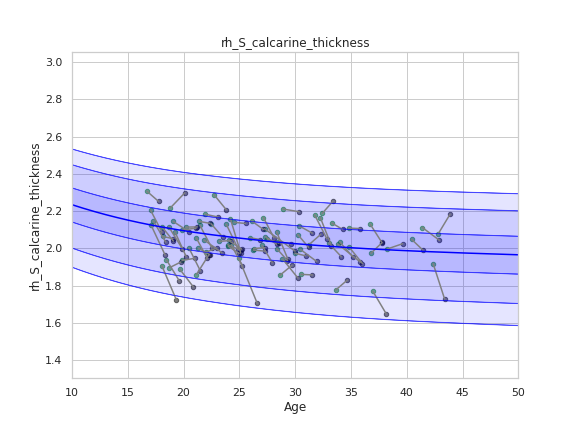

Running IDP 103 Right-Putamen :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([527.27605829]), 'Rho': array([0.3963077]), 'pRho': array([1.18837583e-10]), 'SMSE': array([0.86832117]), 'EXPV': array([0.13340619])}


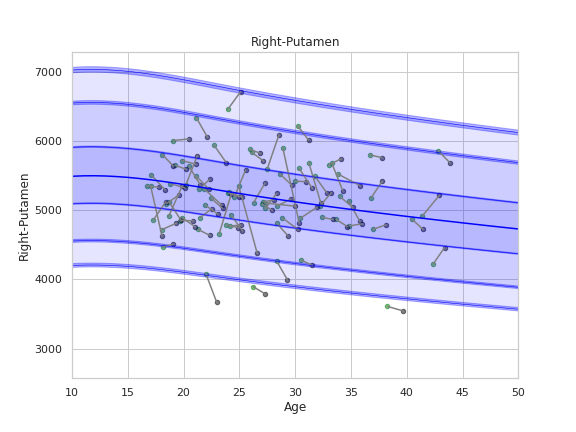

Running IDP 104 lh_G&S_paracentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14281114]), 'Rho': array([0.09873353]), 'pRho': array([0.12807651]), 'SMSE': array([1.11130838]), 'EXPV': array([-0.02902371])}


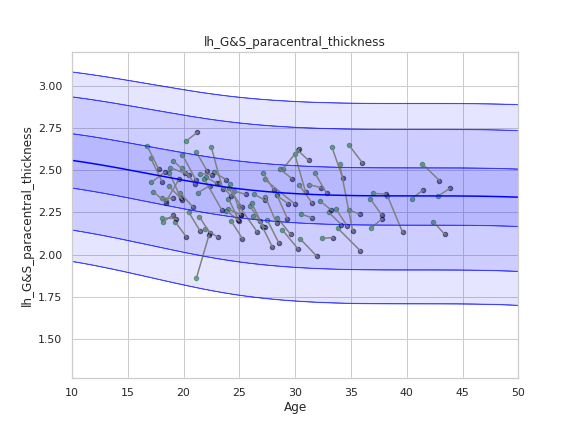

Running IDP 105 Right-Thalamus-Proper :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([716.67145915]), 'Rho': array([0.46871622]), 'pRho': array([5.69366241e-15]), 'SMSE': array([0.82961847]), 'EXPV': array([0.21926941])}


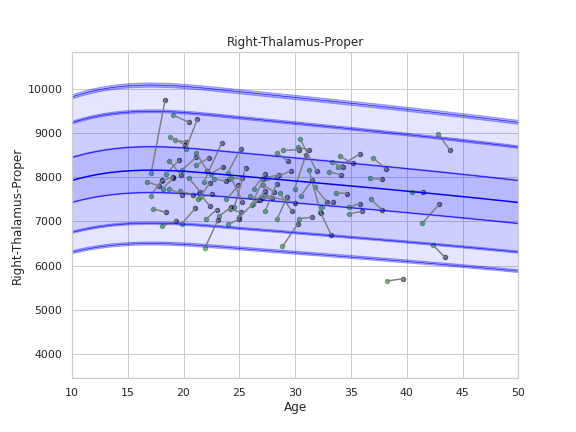

Running IDP 106 rh_S_parieto_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11066214]), 'Rho': array([0.29211922]), 'pRho': array([3.79634396e-06]), 'SMSE': array([1.07434578]), 'EXPV': array([0.04670516])}


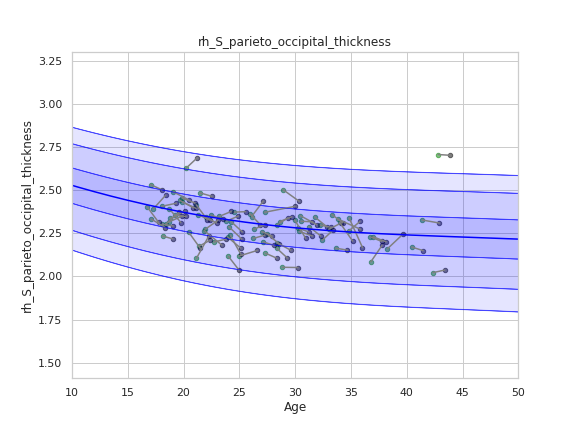

Running IDP 107 lh_S_calcarine_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11507335]), 'Rho': array([0.29051444]), 'pRho': array([4.32143522e-06]), 'SMSE': array([0.95038877]), 'EXPV': array([0.07558673])}


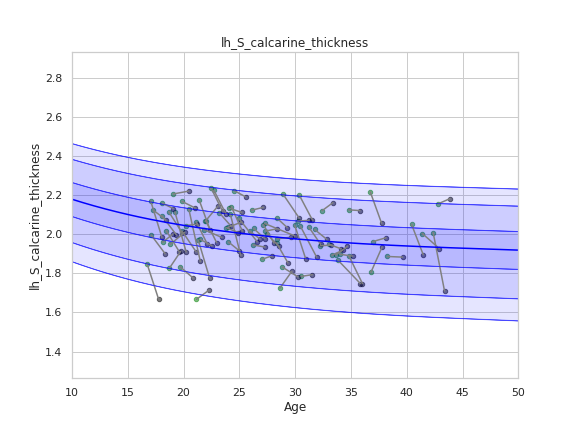

Running IDP 108 lh_S_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10317901]), 'Rho': array([0.30985431]), 'pRho': array([8.57359949e-07]), 'SMSE': array([1.14750854]), 'EXPV': array([0.01305399])}


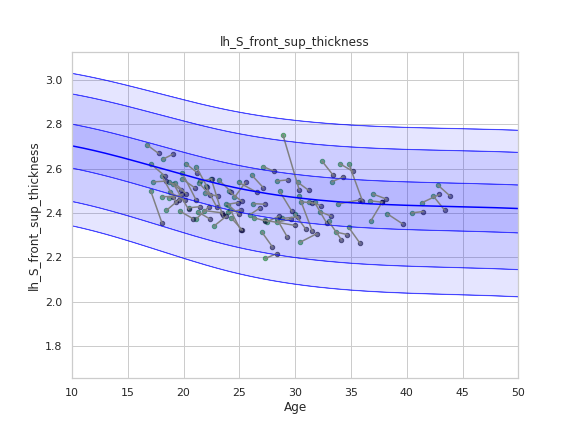

Running IDP 109 rh_G_temp_sup-Plan_tempo_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15354905]), 'Rho': array([0.1862304]), 'pRho': array([0.00379514]), 'SMSE': array([1.06250484]), 'EXPV': array([0.01611198])}


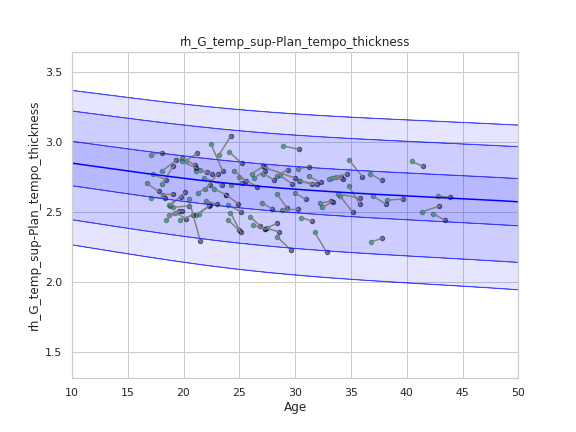

Running IDP 110 rh_S_collat_transv_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17228578]), 'Rho': array([0.24457548]), 'pRho': array([0.00012558]), 'SMSE': array([1.15641485]), 'EXPV': array([0.05902116])}


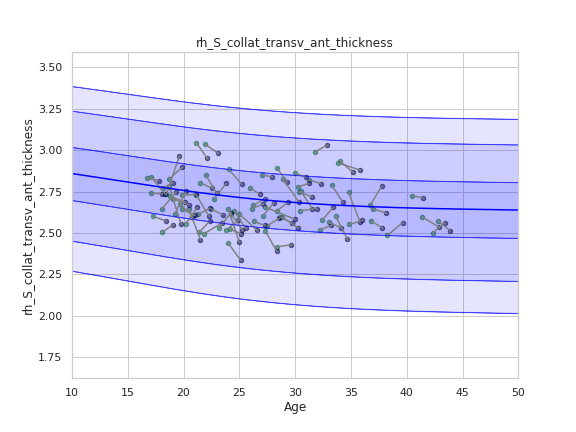

Running IDP 111 Left-Inf-Lat-Vent :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([192.41746759]), 'Rho': array([0.22024323]), 'pRho': array([0.00058215]), 'SMSE': array([1.08735961]), 'EXPV': array([0.04797623])}


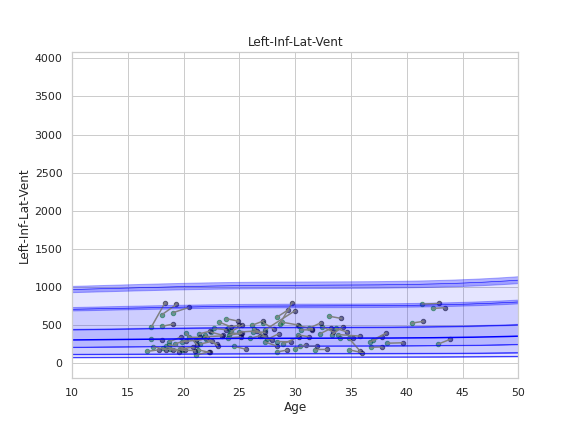

Running IDP 112 rh_G&S_transv_frontopol_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13926353]), 'Rho': array([0.22411656]), 'pRho': array([0.0004611]), 'SMSE': array([1.01883968]), 'EXPV': array([0.0081246])}


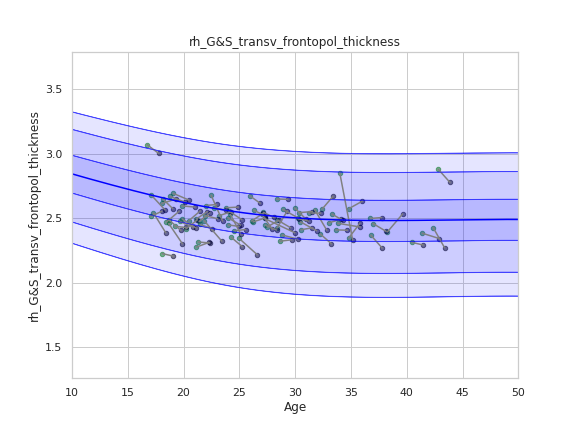

Running IDP 113 lh_S_orbital_lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13563169]), 'Rho': array([0.27384446]), 'pRho': array([1.58136745e-05]), 'SMSE': array([0.97960572]), 'EXPV': array([0.0731904])}


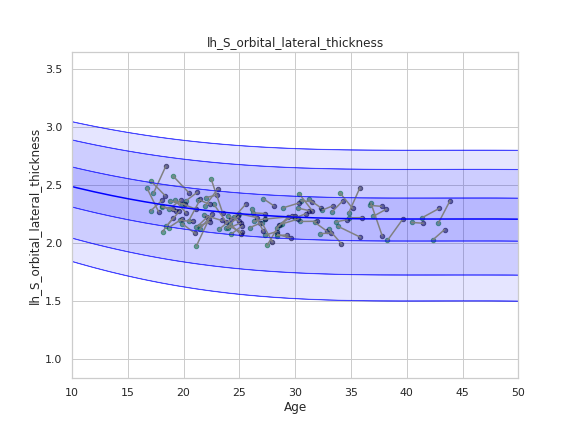

Running IDP 114 lh_S_temporal_transverse_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.23455105]), 'Rho': array([0.1536293]), 'pRho': array([0.01736282]), 'SMSE': array([1.04850984]), 'EXPV': array([0.00972739])}


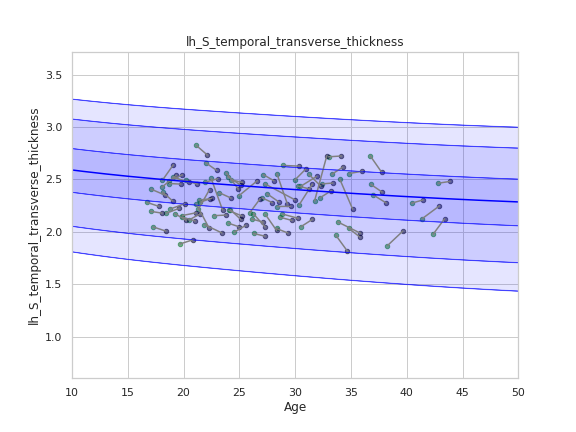

Running IDP 115 Left-Lateral-Ventricle :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([3809.31128763]), 'Rho': array([0.15818646]), 'pRho': array([0.01425843]), 'SMSE': array([1.04632251]), 'EXPV': array([0.01633575])}


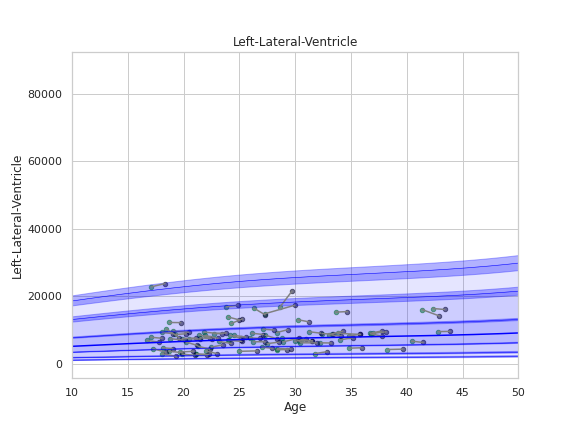

Running IDP 116 rh_S_temporal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.09861796]), 'Rho': array([0.39667945]), 'pRho': array([1.13645519e-10]), 'SMSE': array([1.06669464]), 'EXPV': array([0.09616912])}


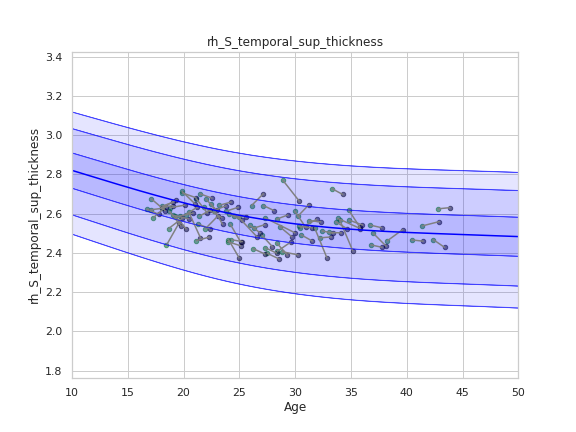

Running IDP 117 rh_S_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10183821]), 'Rho': array([0.23389647]), 'pRho': array([0.00025128]), 'SMSE': array([1.14858757]), 'EXPV': array([-0.04836747])}


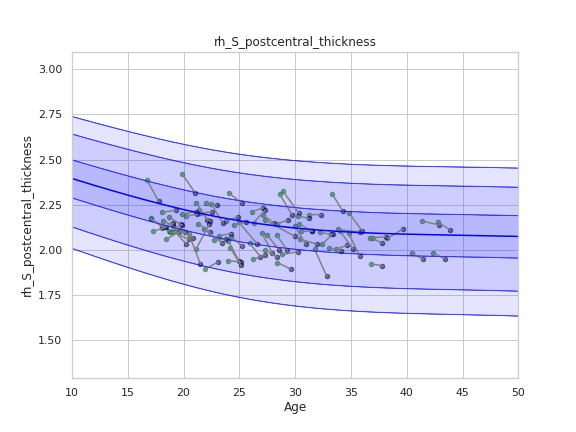

Running IDP 118 Right-VentralDC :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([398.09845082]), 'Rho': array([0.43296139]), 'pRho': array([1.07171606e-12]), 'SMSE': array([0.81288224]), 'EXPV': array([0.1872036])}


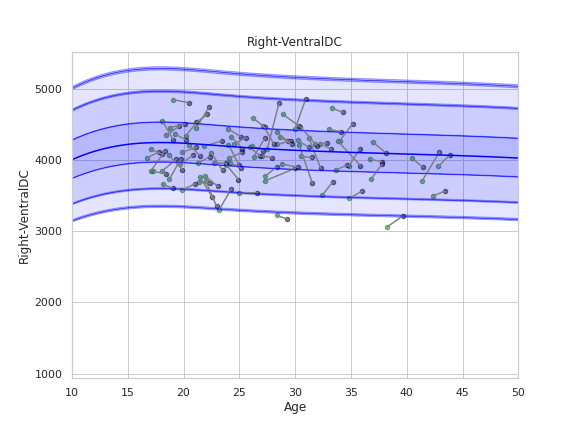

Running IDP 119 lh_Pole_temporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16291391]), 'Rho': array([0.02897398]), 'pRho': array([0.65615258]), 'SMSE': array([1.00999555]), 'EXPV': array([-0.00127605])}


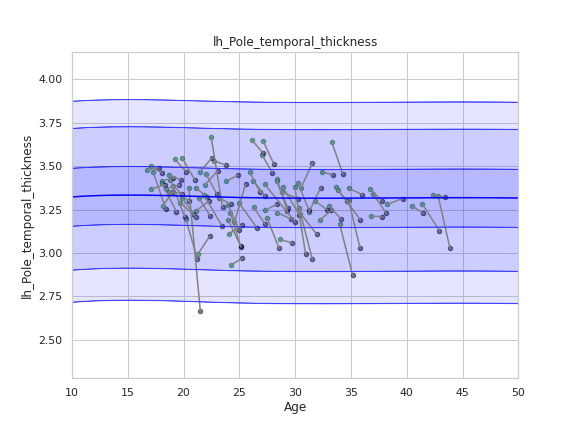

Running IDP 120 rh_G_occipital_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12457697]), 'Rho': array([0.3033944]), 'pRho': array([1.49204771e-06]), 'SMSE': array([0.93446424]), 'EXPV': array([0.09200005])}


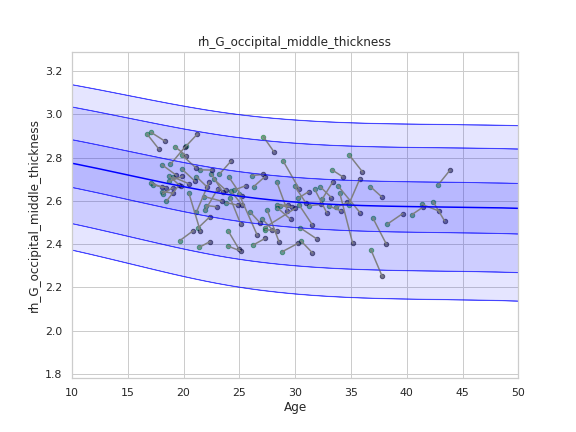

Running IDP 121 lh_S_front_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11890198]), 'Rho': array([0.35188323]), 'pRho': array([1.63226506e-08]), 'SMSE': array([1.11841801]), 'EXPV': array([0.08757352])}


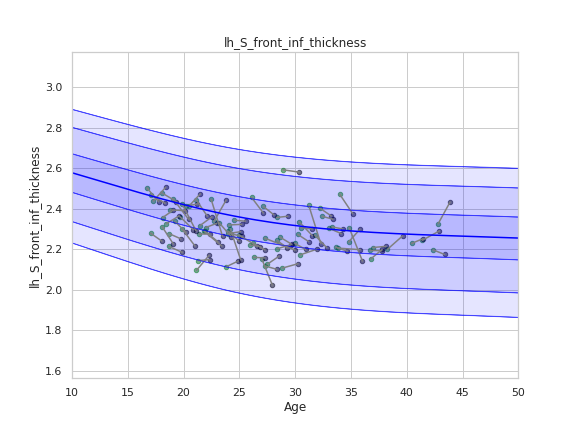

Running IDP 122 lh_G&S_occipital_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18992703]), 'Rho': array([0.24460101]), 'pRho': array([0.00012537]), 'SMSE': array([0.97397463]), 'EXPV': array([0.04894167])}


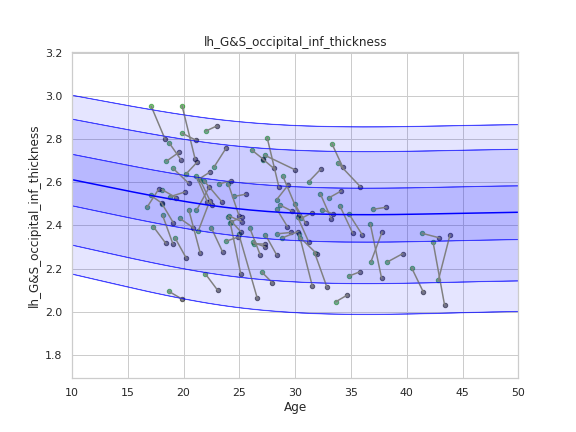

Running IDP 123 Left-Thalamus-Proper :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([752.41973218]), 'Rho': array([0.45279725]), 'pRho': array([6.37808815e-14]), 'SMSE': array([0.87582018]), 'EXPV': array([0.20316423])}


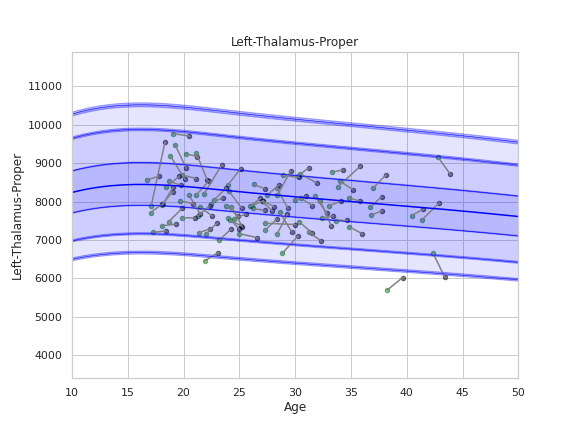

Running IDP 124 lh_G_Ins_lg&S_cent_ins_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22624061]), 'Rho': array([0.24526872]), 'pRho': array([0.00011992]), 'SMSE': array([0.99168759]), 'EXPV': array([0.06012129])}


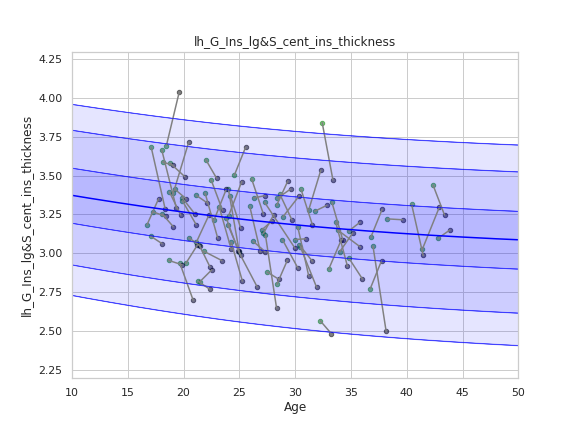

Running IDP 125 lh_G_precuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12425912]), 'Rho': array([0.26139953]), 'pRho': array([3.93774135e-05]), 'SMSE': array([1.07450272]), 'EXPV': array([0.01092214])}


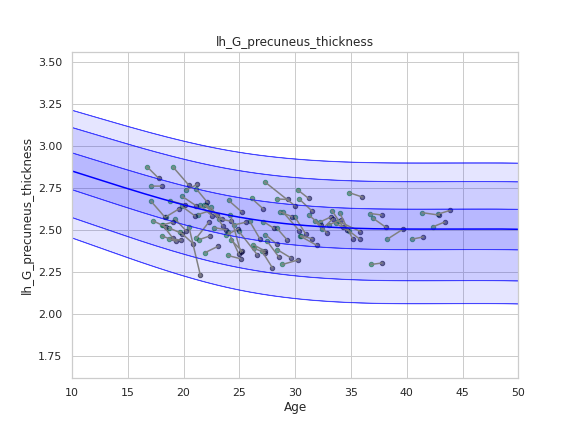

Running IDP 126 rh_G&S_frontomargin_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11818003]), 'Rho': array([0.29121179]), 'pRho': array([4.08529681e-06]), 'SMSE': array([1.00691765]), 'EXPV': array([0.08326329])}


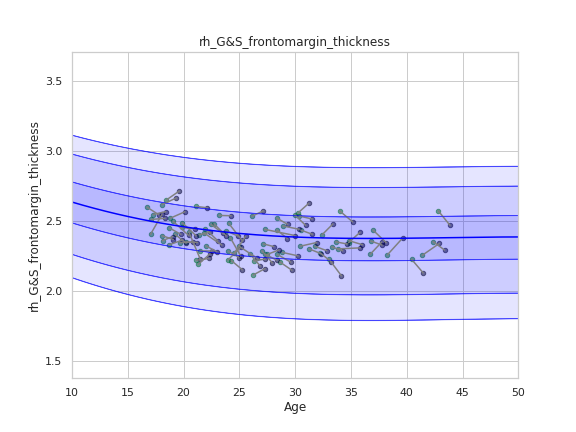

Running IDP 127 lh_G_pariet_inf-Supramar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11961007]), 'Rho': array([0.35278725]), 'pRho': array([1.48832349e-08]), 'SMSE': array([0.94983079]), 'EXPV': array([0.11177916])}


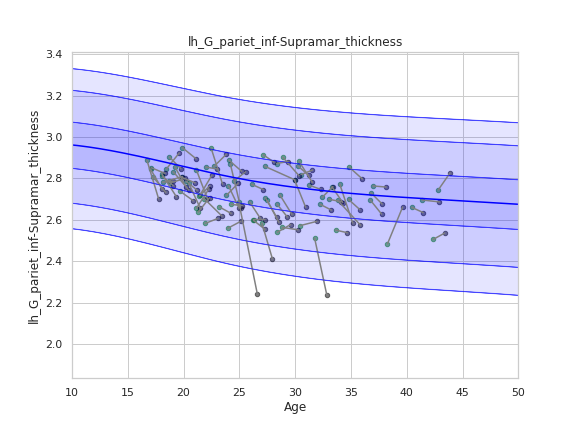

Running IDP 128 lh_G_front_inf-Triangul_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15169078]), 'Rho': array([0.28546762]), 'pRho': array([6.45990895e-06]), 'SMSE': array([1.21475092]), 'EXPV': array([0.02375843])}


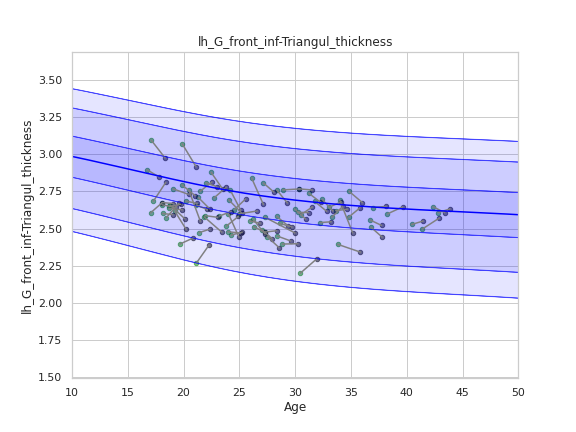

Running IDP 129 Left-VentralDC :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([393.82637289]), 'Rho': array([0.44043769]), 'pRho': array([3.78912951e-13]), 'SMSE': array([0.80611319]), 'EXPV': array([0.1939764])}


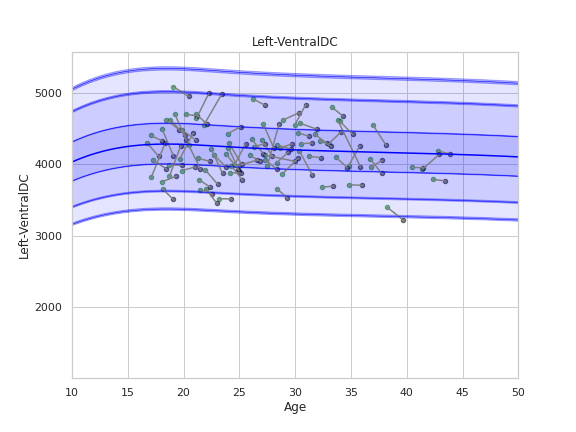

Running IDP 130 lh_S_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.09747104]), 'Rho': array([0.36703451]), 'pRho': array([3.33182507e-09]), 'SMSE': array([0.94718631]), 'EXPV': array([0.1020842])}


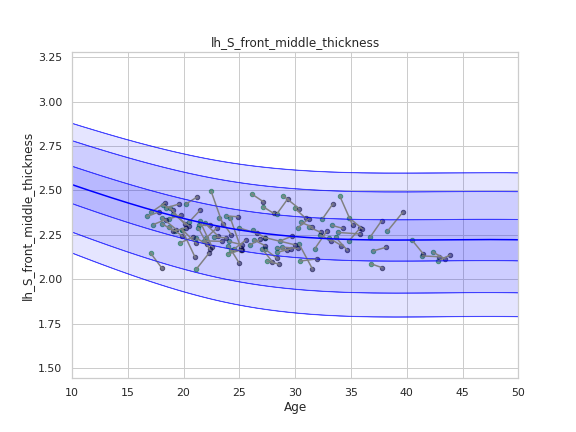

Running IDP 131 Left-Amygdala :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([168.22286391]), 'Rho': array([0.39817314]), 'pRho': array([9.49144169e-11]), 'SMSE': array([0.87296766]), 'EXPV': array([0.14810624])}


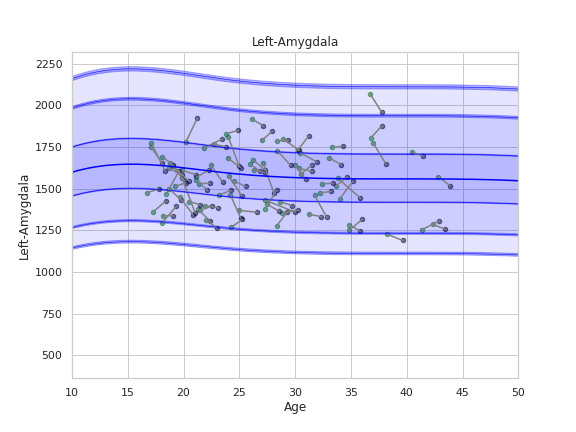

Running IDP 132 Left-Pallidum :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([220.23340552]), 'Rho': array([0.44529063]), 'pRho': array([1.90029565e-13]), 'SMSE': array([0.80537894]), 'EXPV': array([0.19501428])}


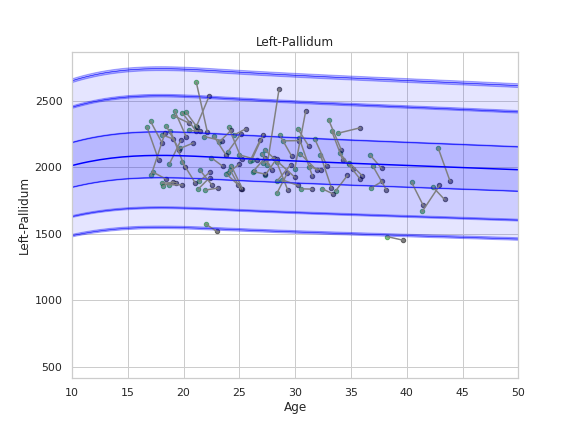

Running IDP 133 rh_S_suborbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17270314]), 'Rho': array([0.13893523]), 'pRho': array([0.03169326]), 'SMSE': array([1.03368116]), 'EXPV': array([-0.0194811])}


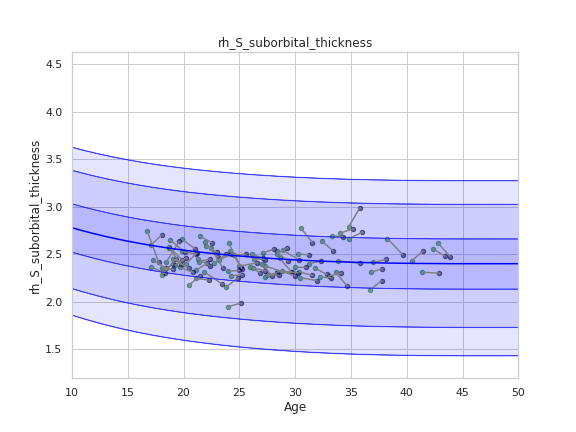

Running IDP 134 rh_G&S_cingul-Mid-Post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11003865]), 'Rho': array([0.42005855]), 'pRho': array([6.04149504e-12]), 'SMSE': array([0.95209779]), 'EXPV': array([0.15179746])}


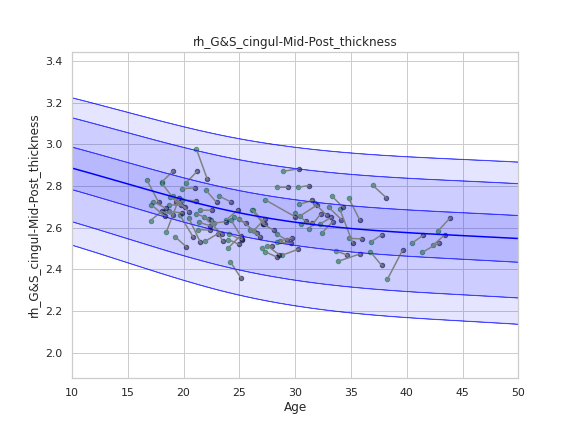

Running IDP 135 lh_S_intrapariet&P_trans_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10202566]), 'Rho': array([0.30044157]), 'pRho': array([1.91317427e-06]), 'SMSE': array([1.02733266]), 'EXPV': array([0.05973267])}


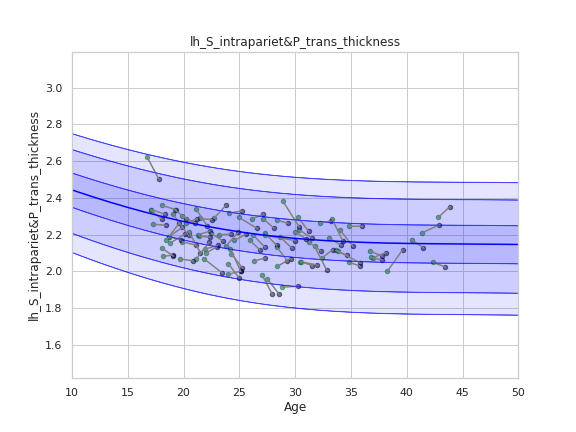

Running IDP 136 rh_S_subparietal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10960644]), 'Rho': array([0.35000884]), 'pRho': array([1.97464258e-08]), 'SMSE': array([0.97720404]), 'EXPV': array([0.10137467])}


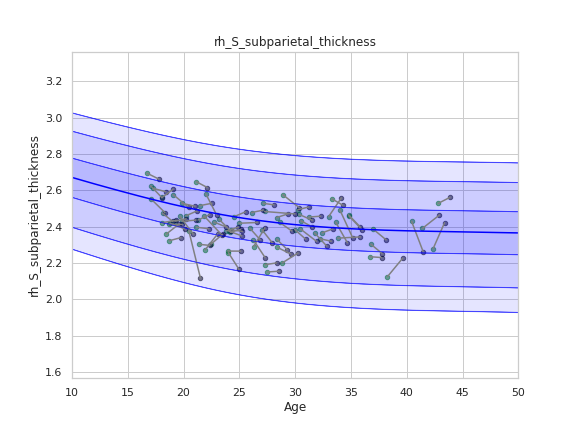

Running IDP 137 rh_G_oc-temp_med-Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13483657]), 'Rho': array([0.17926497]), 'pRho': array([0.00536926]), 'SMSE': array([1.06185924]), 'EXPV': array([0.02885726])}


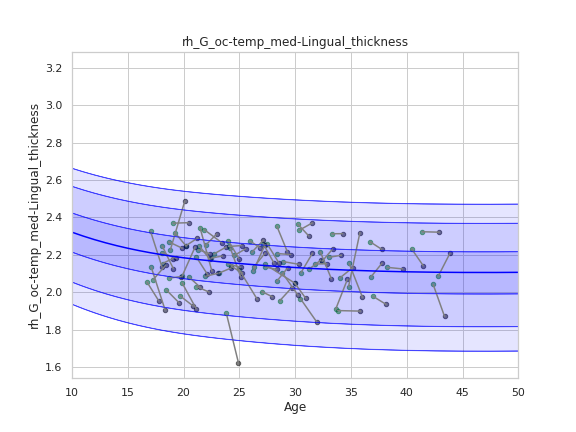

Running IDP 138 lh_G_oc-temp_med-Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13485826]), 'Rho': array([0.08874683]), 'pRho': array([0.17164069]), 'SMSE': array([1.04012616]), 'EXPV': array([-0.00588252])}


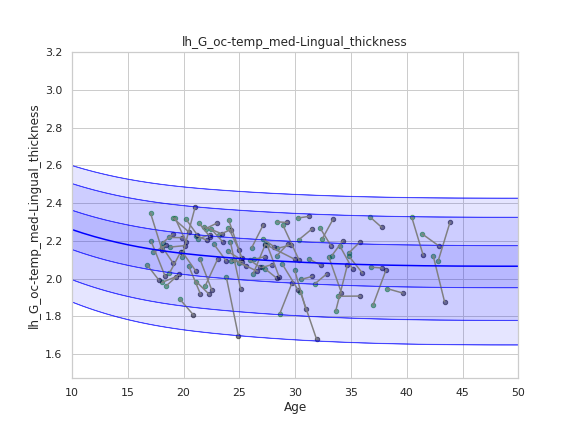

Running IDP 139 lh_Lat_Fis-post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11707693]), 'Rho': array([0.3697345]), 'pRho': array([2.48645295e-09]), 'SMSE': array([1.02029609]), 'EXPV': array([0.11690769])}


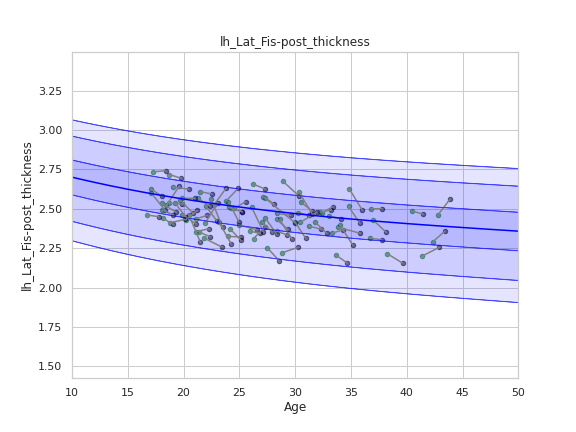

Running IDP 140 Right-Inf-Lat-Vent :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([164.93832445]), 'Rho': array([0.19551055]), 'pRho': array([0.00234496]), 'SMSE': array([1.03084214]), 'EXPV': array([0.0346988])}


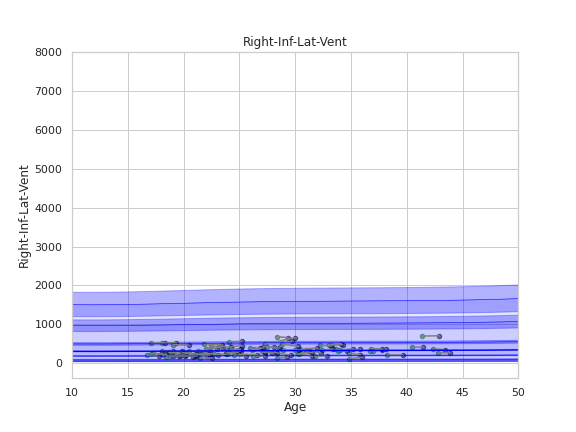

Running IDP 141 rh_S_circular_insula_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14904256]), 'Rho': array([0.38110723]), 'pRho': array([7.01617781e-10]), 'SMSE': array([0.91031962]), 'EXPV': array([0.14112056])}


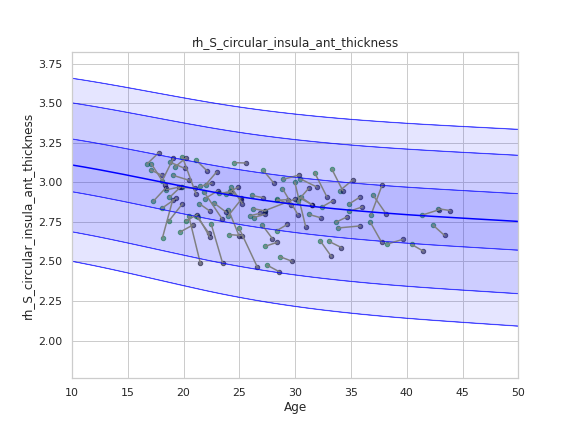

Running IDP 142 SupraTentorialVol :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([91688.12579931]), 'Rho': array([0.52702289]), 'pRho': array([2.20594647e-19]), 'SMSE': array([0.75915495]), 'EXPV': array([0.27482451])}


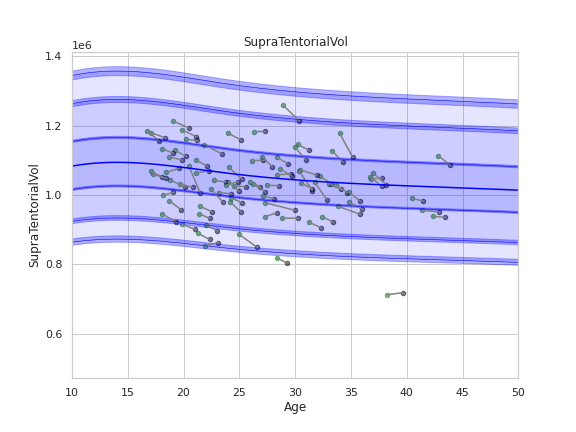

Running IDP 143 rh_G_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14679463]), 'Rho': array([0.34017134]), 'pRho': array([5.24939812e-08]), 'SMSE': array([0.96391316]), 'EXPV': array([0.11019206])}


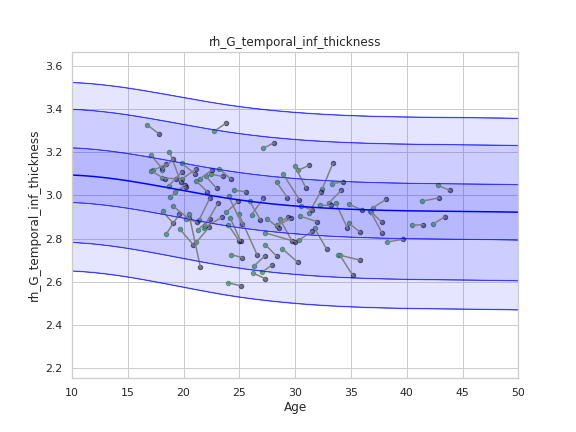

Running IDP 144 lh_G&S_frontomargin_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13505659]), 'Rho': array([0.22954195]), 'pRho': array([0.00033035]), 'SMSE': array([0.95920119]), 'EXPV': array([0.04610675])}


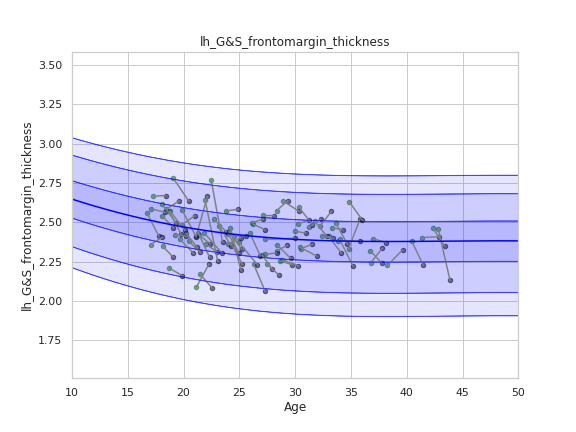

Running IDP 145 lh_S_pericallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14197156]), 'Rho': array([-0.03519096]), 'pRho': array([0.58861981]), 'SMSE': array([1.14248836]), 'EXPV': array([-0.1106443])}


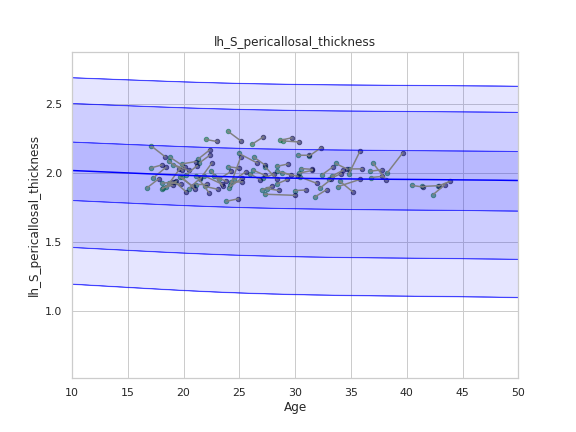

Running IDP 146 lh_S_oc-temp_med&Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11311099]), 'Rho': array([0.2405167]), 'pRho': array([0.00016409]), 'SMSE': array([1.04776071]), 'EXPV': array([0.03254636])}


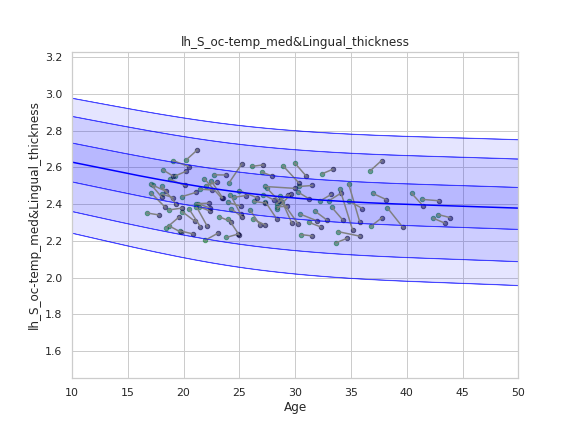

Running IDP 147 Left-vessel :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([19.37678747]), 'Rho': array([0.14605941]), 'pRho': array([0.02382307]), 'SMSE': array([1.07218197]), 'EXPV': array([0.02045775])}


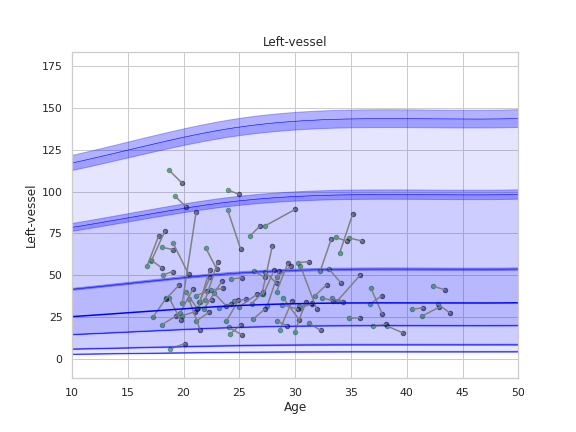

Running IDP 148 lh_G_parietal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1218372]), 'Rho': array([0.23242229]), 'pRho': array([0.00027583]), 'SMSE': array([1.04285999]), 'EXPV': array([0.02310589])}


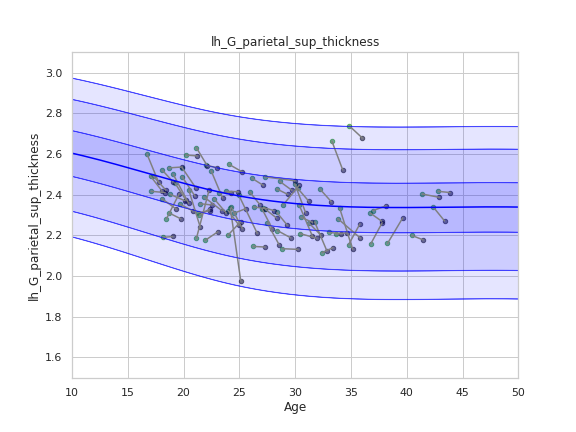

Running IDP 149 rh_S_orbital_med-olfact_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12208156]), 'Rho': array([0.37354596]), 'pRho': array([1.63676094e-09]), 'SMSE': array([0.88233153]), 'EXPV': array([0.13714488])}


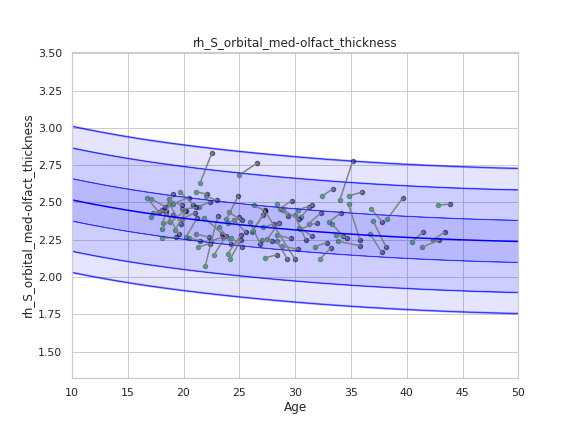

Running IDP 150 Left-Hippocampus :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([366.15338673]), 'Rho': array([0.37601884]), 'pRho': array([1.24392515e-09]), 'SMSE': array([0.91394636]), 'EXPV': array([0.14098683])}


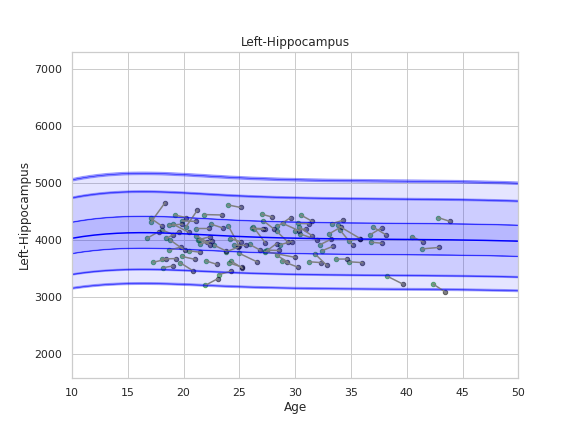

Running IDP 151 lh_G_occipital_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14178925]), 'Rho': array([0.26219735]), 'pRho': array([3.71927089e-05]), 'SMSE': array([0.94392897]), 'EXPV': array([0.06635085])}


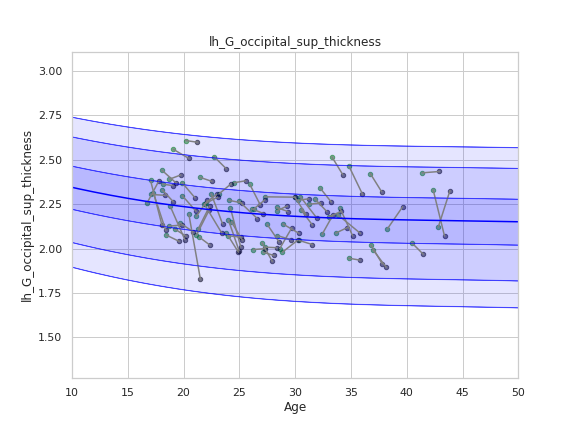

Running IDP 152 lh_G_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13221493]), 'Rho': array([0.32773824]), 'pRho': array([1.71661358e-07]), 'SMSE': array([1.21227435]), 'EXPV': array([0.02002639])}


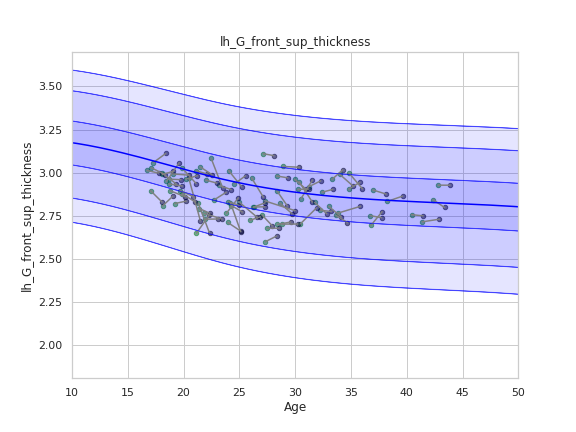

Running IDP 153 lh_G_cingul-Post-ventral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.2054741]), 'Rho': array([0.28544258]), 'pRho': array([6.47267645e-06]), 'SMSE': array([0.9197669]), 'EXPV': array([0.08092065])}


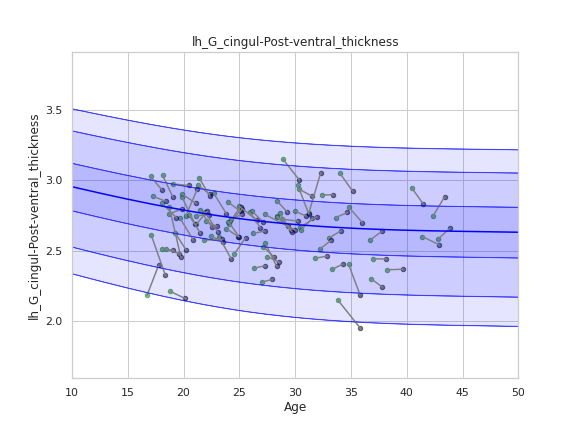

Running IDP 154 rh_S_occipital_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13580459]), 'Rho': array([0.18758491]), 'pRho': array([0.00354247]), 'SMSE': array([1.08197843]), 'EXPV': array([0.00693607])}


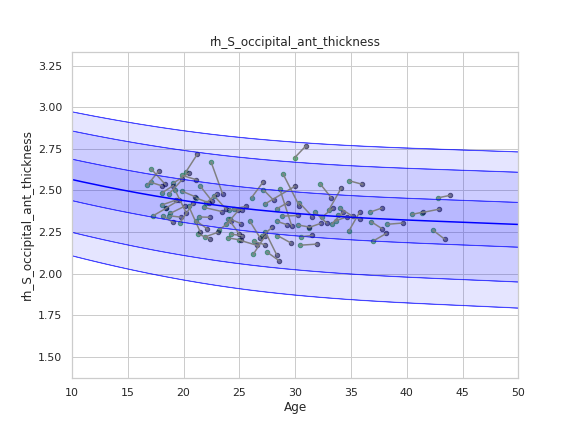

Running IDP 155 rh_G_rectus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12935794]), 'Rho': array([0.31374551]), 'pRho': array([6.09913436e-07]), 'SMSE': array([0.95145565]), 'EXPV': array([0.09603115])}


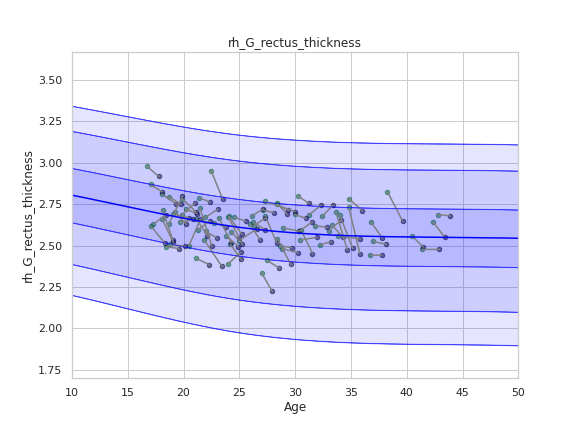

Running IDP 156 rh_G_temp_sup-Plan_polar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18926755]), 'Rho': array([0.25446979]), 'pRho': array([6.41345846e-05]), 'SMSE': array([0.94841691]), 'EXPV': array([0.06473266])}


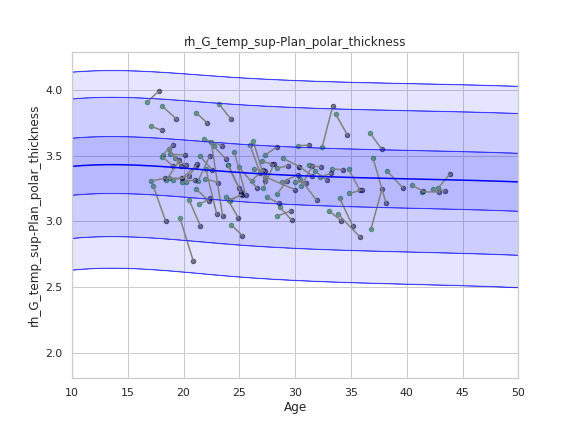

Running IDP 157 lh_S_oc_sup&transversal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11128929]), 'Rho': array([0.17651596]), 'pRho': array([0.0061366]), 'SMSE': array([1.10730594]), 'EXPV': array([-0.00296762])}


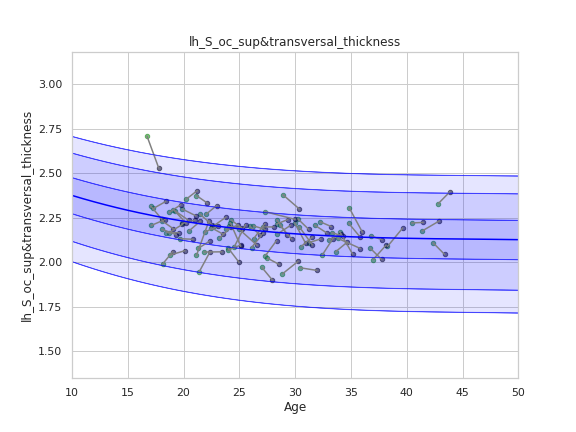

Running IDP 158 rh_S_oc_sup&transversal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11188329]), 'Rho': array([0.1359553]), 'pRho': array([0.03558851]), 'SMSE': array([1.13676412]), 'EXPV': array([-0.05809609])}


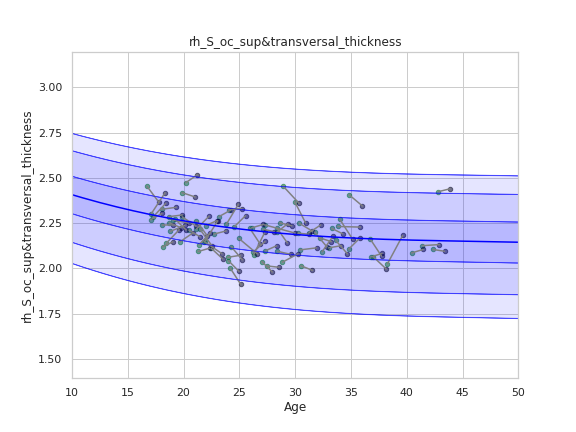

Running IDP 159 rh_S_cingul-Marginalis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10769526]), 'Rho': array([0.337958]), 'pRho': array([6.5087268e-08]), 'SMSE': array([1.05884842]), 'EXPV': array([0.04875998])}


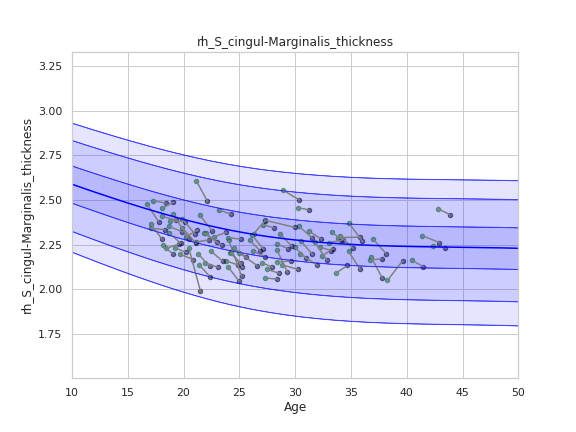

Running IDP 160 rh_G_cuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14805959]), 'Rho': array([0.15055975]), 'pRho': array([0.01977124]), 'SMSE': array([1.00551687]), 'EXPV': array([0.01849041])}


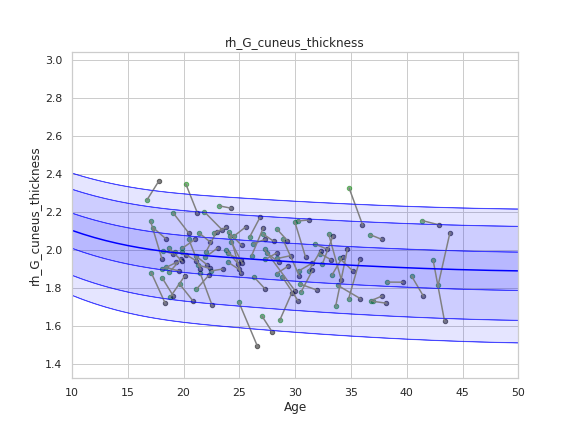

Running IDP 161 Right-Caudate :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([488.03658011]), 'Rho': array([0.32099804]), 'pRho': array([3.18855444e-07]), 'SMSE': array([0.90787715]), 'EXPV': array([0.09414358])}


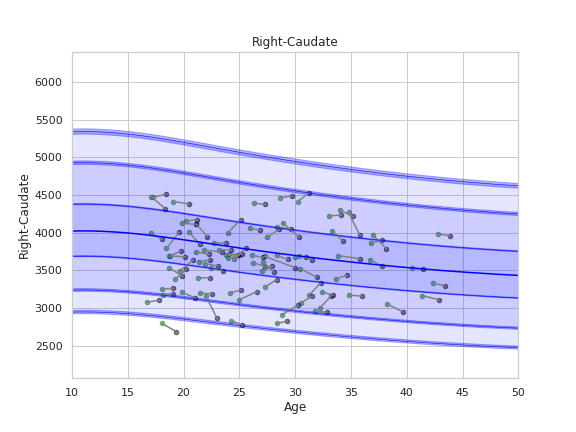

Running IDP 162 rh_S_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11032775]), 'Rho': array([0.30957029]), 'pRho': array([8.78761063e-07]), 'SMSE': array([1.19791517]), 'EXPV': array([0.04633619])}


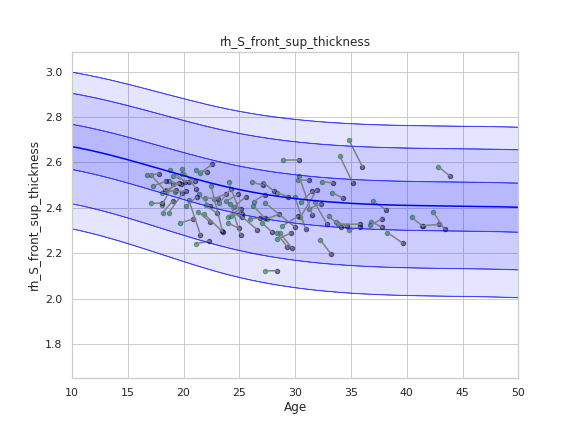

Running IDP 163 rh_S_temporal_transverse_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1955266]), 'Rho': array([0.21343595]), 'pRho': array([0.00086827]), 'SMSE': array([0.98019999]), 'EXPV': array([0.0376893])}


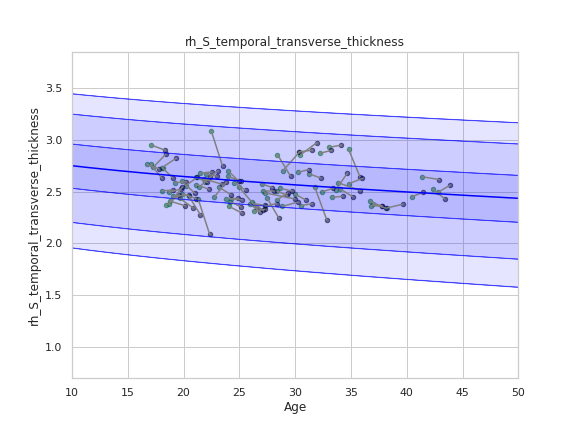

Running IDP 164 lh_G_cingul-Post-dorsal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13864652]), 'Rho': array([0.32944319]), 'pRho': array([1.46400203e-07]), 'SMSE': array([0.95440532]), 'EXPV': array([0.07086639])}


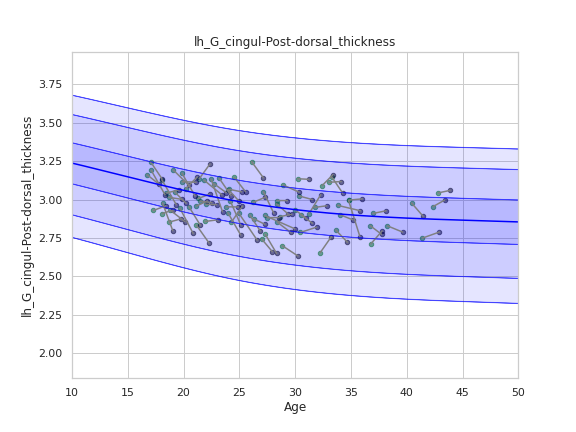

Running IDP 165 rh_G&S_paracentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.140972]), 'Rho': array([0.11363579]), 'pRho': array([0.07955413]), 'SMSE': array([1.05290529]), 'EXPV': array([-0.01858534])}


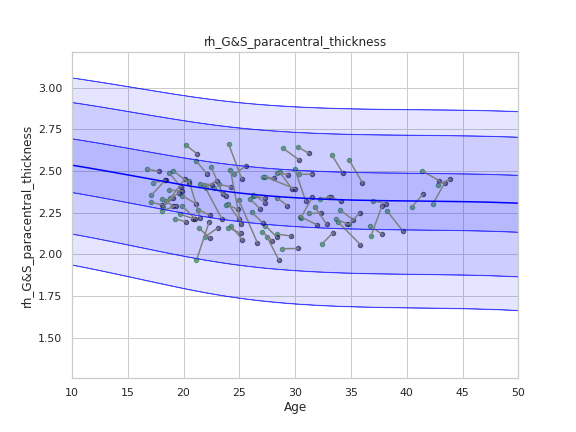

Running IDP 166 rh_S_front_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11304778]), 'Rho': array([0.38593896]), 'pRho': array([4.0328584e-10]), 'SMSE': array([1.10779631]), 'EXPV': array([0.12421253])}


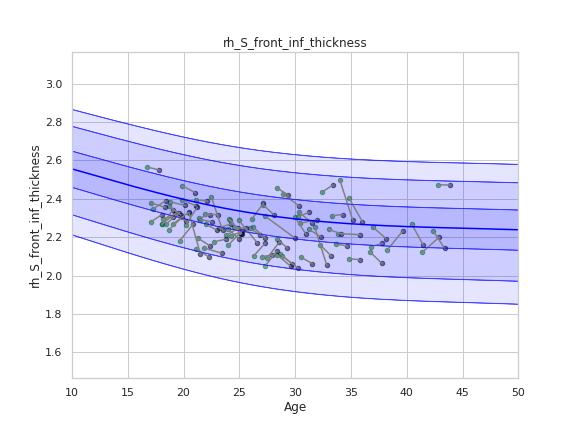

Running IDP 167 lh_S_occipital_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12991803]), 'Rho': array([0.20895192]), 'pRho': array([0.00112216]), 'SMSE': array([1.02150235]), 'EXPV': array([0.03666194])}


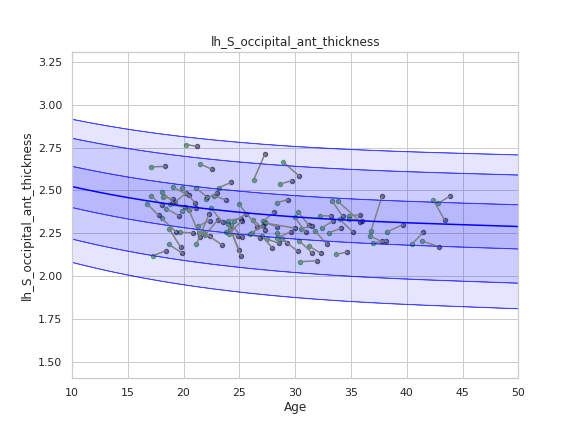

Running IDP 168 lh_S_circular_insula_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17251232]), 'Rho': array([0.3160561]), 'pRho': array([4.97033101e-07]), 'SMSE': array([0.99006124]), 'EXPV': array([0.08939464])}


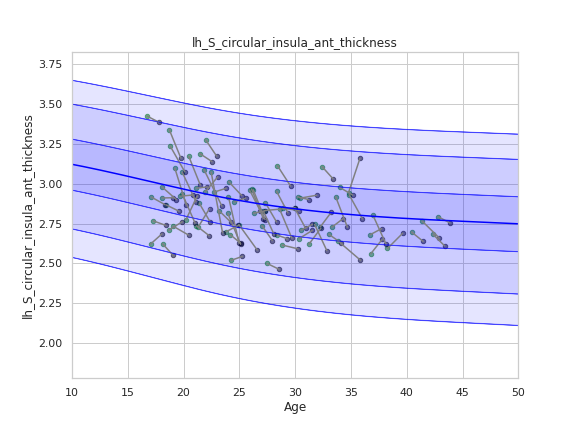

Running IDP 169 rh_S_orbital-H_Shaped_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11709167]), 'Rho': array([0.23118692]), 'pRho': array([0.0002981]), 'SMSE': array([1.23915198]), 'EXPV': array([-0.02352515])}


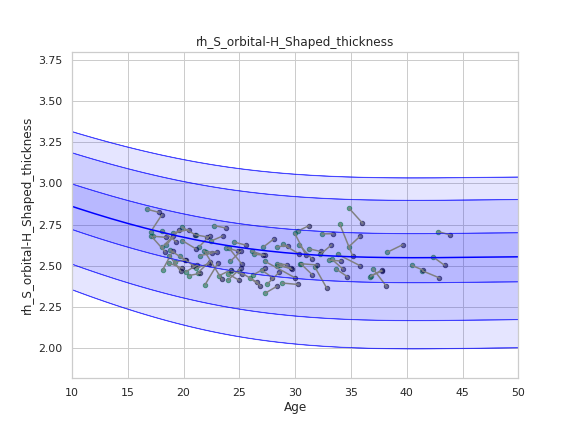

Running IDP 170 rh_G_pariet_inf-Angular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12601054]), 'Rho': array([0.34689926]), 'pRho': array([2.70028142e-08]), 'SMSE': array([0.92836352]), 'EXPV': array([0.11534252])}


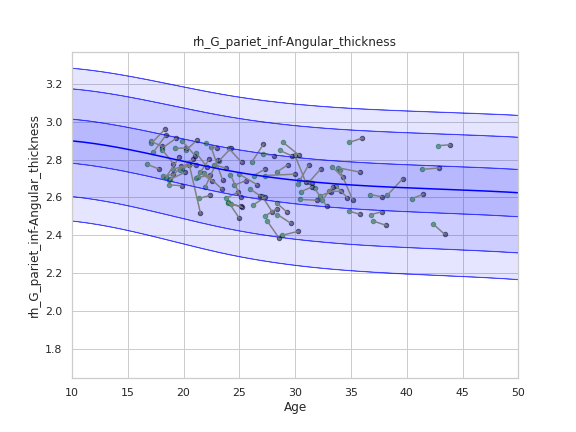

Running IDP 171 rh_G_insular_short_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20448687]), 'Rho': array([0.24600206]), 'pRho': array([0.00011419]), 'SMSE': array([0.99031364]), 'EXPV': array([0.06050644])}


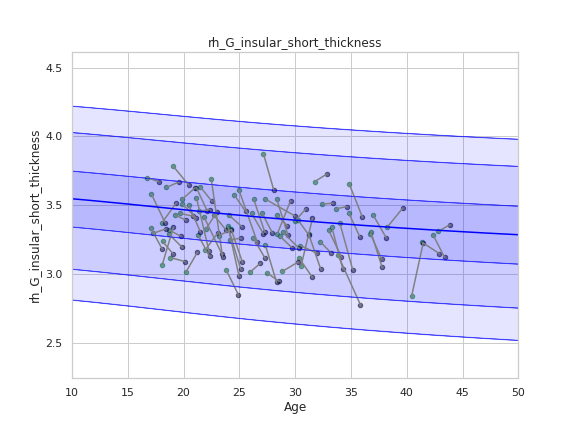

Running IDP 172 rh_Pole_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19555813]), 'Rho': array([0.20309879]), 'pRho': array([0.00155586]), 'SMSE': array([0.97464273]), 'EXPV': array([0.03095298])}


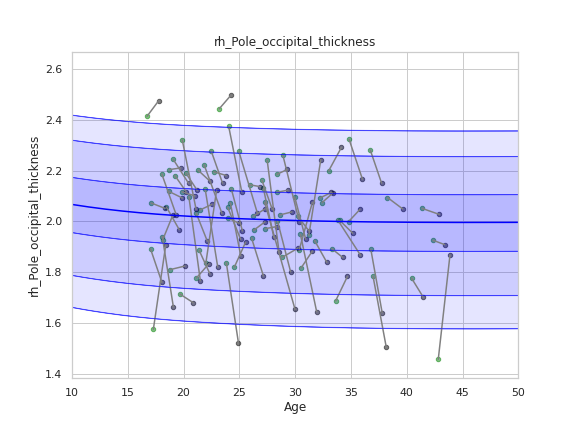

Running IDP 173 lh_S_circular_insula_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15609784]), 'Rho': array([0.43295126]), 'pRho': array([1.07320545e-12]), 'SMSE': array([0.95915864]), 'EXPV': array([0.18545529])}


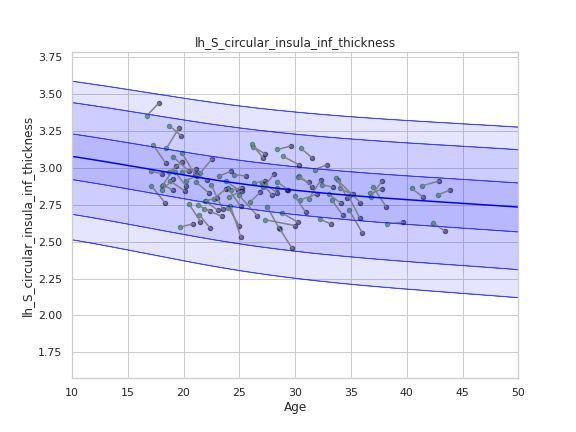

Running IDP 174 rh_S_orbital_lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1419881]), 'Rho': array([0.26586879]), 'pRho': array([2.85305179e-05]), 'SMSE': array([1.02897192]), 'EXPV': array([0.05691401])}


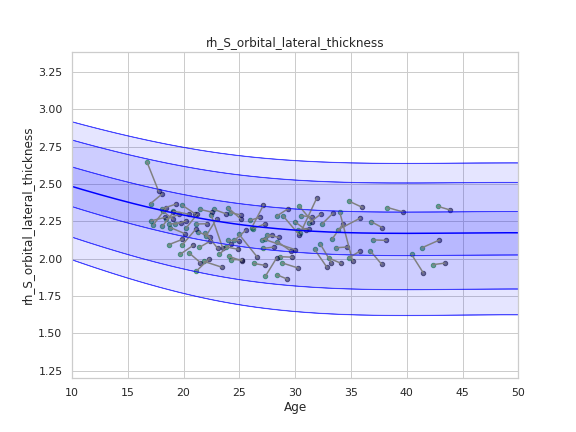

Running IDP 175 rh_Lat_Fis-post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11205319]), 'Rho': array([0.37088618]), 'pRho': array([2.19269475e-09]), 'SMSE': array([0.97202483]), 'EXPV': array([0.10194421])}


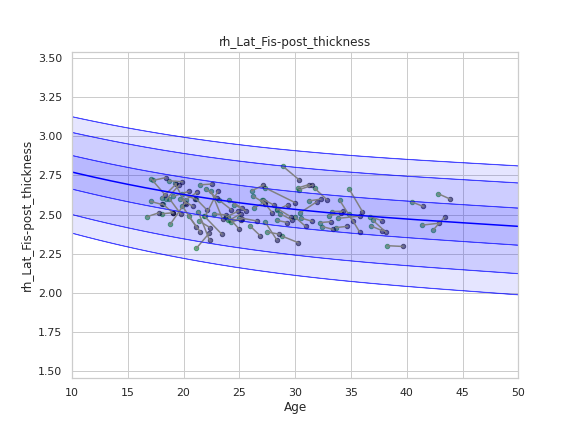

Running IDP 176 lh_G_temp_sup-Lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17180023]), 'Rho': array([0.20316024]), 'pRho': array([0.00155061]), 'SMSE': array([0.97168012]), 'EXPV': array([0.03826508])}


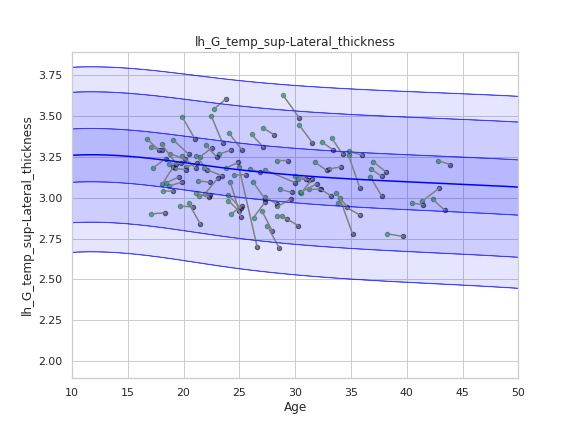

Running IDP 177 rh_S_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.120076]), 'Rho': array([0.30087624]), 'pRho': array([1.84475789e-06]), 'SMSE': array([0.97921045]), 'EXPV': array([0.08681242])}


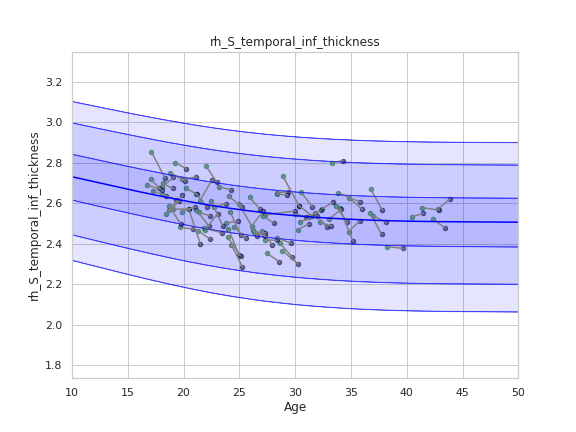

Running IDP 178 lh_G_orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.10985181]), 'Rho': array([0.35081714]), 'pRho': array([1.81927153e-08]), 'SMSE': array([0.98297948]), 'EXPV': array([0.08846197])}


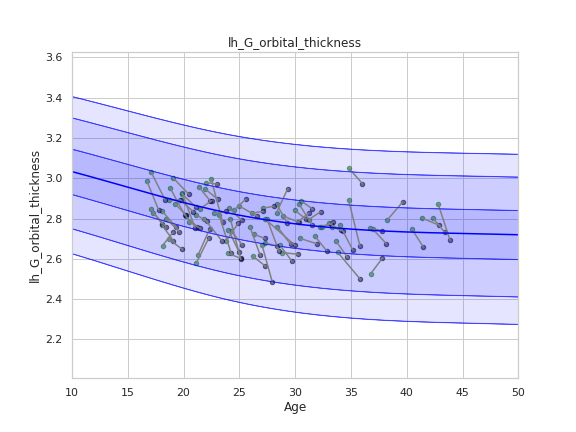

Running IDP 179 lh_S_suborbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22714608]), 'Rho': array([0.13008654]), 'pRho': array([0.04445066]), 'SMSE': array([1.00394973]), 'EXPV': array([0.00313679])}


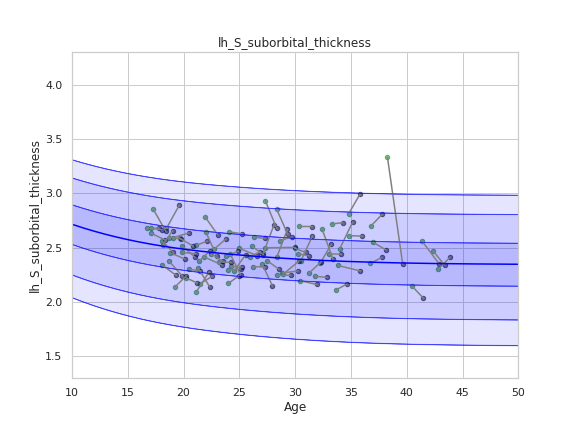

Running IDP 180 rh_G_oc-temp_med-Parahip_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19140447]), 'Rho': array([-0.02402062]), 'pRho': array([0.71206599]), 'SMSE': array([1.01800083]), 'EXPV': array([-0.01619398])}


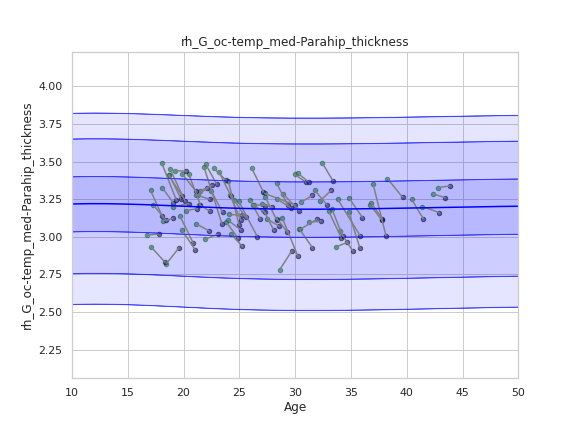

Running IDP 181 lh_G&S_cingul-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11030565]), 'Rho': array([0.39220017]), 'pRho': array([1.93900719e-10]), 'SMSE': array([0.95705609]), 'EXPV': array([0.11752306])}


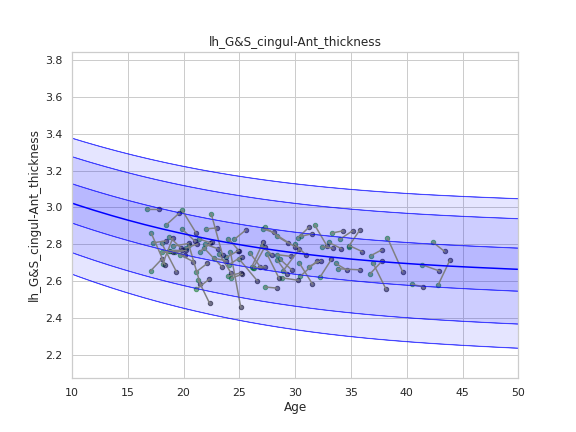

Running IDP 182 lh_S_subparietal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.11443625]), 'Rho': array([0.28019721]), 'pRho': array([9.74555096e-06]), 'SMSE': array([1.09182249]), 'EXPV': array([0.04471744])}


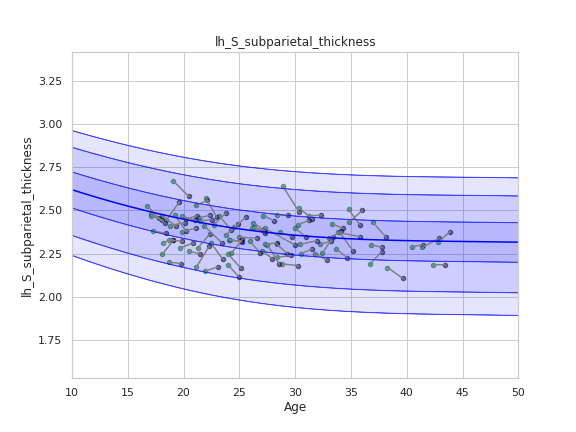

Running IDP 183 lh_S_collat_transv_post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13514975]), 'Rho': array([0.17044324]), 'pRho': array([0.00818829]), 'SMSE': array([1.01460912]), 'EXPV': array([0.00848868])}


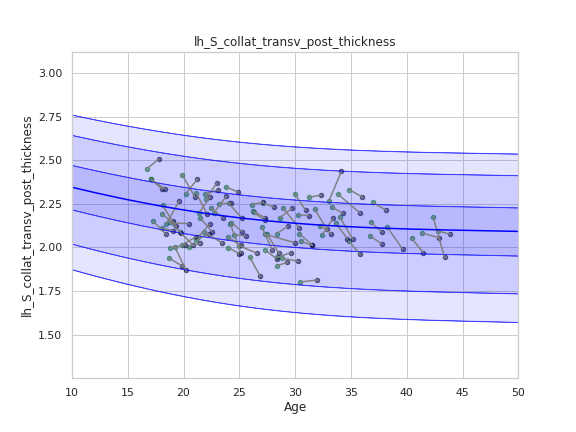

Running IDP 184 lh_G_oc-temp_lat-fusifor_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13055403]), 'Rho': array([0.28346077]), 'pRho': array([7.56266552e-06]), 'SMSE': array([0.92381321]), 'EXPV': array([0.07701709])}


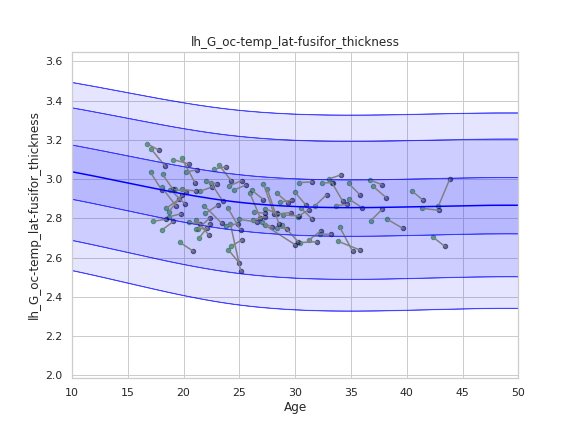

In [12]:
###
# Plotting longitudinal "results" of normative models
###

sns.set(style='whitegrid')

for idp_num, idp in enumerate(idp_ids): 
    print('Running IDP', idp_num, idp, ':')
    idp_dir = os.path.join(pretrained_dir,'models',model_name, idp)
    idp_visit_dir = os.path.join(visit_dir,idp)
    os.chdir(idp_visit_dir)
    
    # load the true data points
    yhat_te = load_2d(os.path.join(idp_visit_dir, 'yhat_predict.txt'))
    s2_te = load_2d(os.path.join(idp_visit_dir, 'ys2_predict.txt'))
    y_te = load_2d(os.path.join(idp_visit_dir, 'resp_te.txt'))
            
    # set up the covariates for the dummy data
    print('Making predictions with dummy covariates (for visualisation)')
    yhat, s2 = predict(cov_file_dummy, 
                       alg = 'blr', 
                       respfile = None, 
                       model_path = os.path.join(idp_dir,'Models'), 
                       outputsuffix = '_dummy')
    
    # load the normative model
    with open(os.path.join(idp_dir,'Models', 'NM_0_0_estimate.pkl'), 'rb') as handle:
        nm = pickle.load(handle) 
    
    # get the warp and warp parameters
    W = nm.blr.warp
    warp_param = nm.blr.hyp[1:nm.blr.warp.get_n_params()+1] 
        
    # first, we warp predictions for the true data and compute evaluation metrics
    med_te = W.warp_predictions(np.squeeze(yhat_te), np.squeeze(s2_te), warp_param)[0]
    med_te = med_te[:, np.newaxis]
    print('metrics:', evaluate(y_te, med_te))
    
    # then, we warp dummy predictions to create the plots
    med, pr_int = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param)
    
    # extract the different variance components to visualise
    beta, junk1, junk2 = nm.blr._parse_hyps(nm.blr.hyp, X_dummy)
    s2n = 1/beta # variation (aleatoric uncertainty)
    s2s = s2-s2n # modelling uncertainty (epistemic uncertainty)
    
    # plot the (adjusted) data points
    x_coords = np.concatenate((v1_plot['age'].to_numpy()[np.newaxis,:],v2_plot['age'].to_numpy()[np.newaxis,:]),axis=0)
    y_coords = np.concatenate((v1_plot.loc[:,idp].to_numpy()[np.newaxis,:],v2_plot.loc[:,idp].to_numpy()[np.newaxis,:]),axis=0)

    plt.figure(figsize=(8,6))
    plt.plot(x_coords, y_coords, color='gray')
    plt.scatter(v1_plot['age'], v1_plot.loc[:,idp], color='green', s=20, alpha = 0.5)
    plt.scatter(v2_plot['age'], v2_plot.loc[:,idp], color='black', s=20, alpha = 0.5)
       
    # plot the median of the dummy data
    plt.plot(xx, med, clr)
    
    # fill the gaps in between the centiles
    junk, pr_int25 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.01,0.99])
    plt.fill_between(xx, pr_int25[:,0], pr_int25[:,1], alpha = 0.1,color=clr)
    plt.fill_between(xx, pr_int95[:,0], pr_int95[:,1], alpha = 0.1,color=clr)
    plt.fill_between(xx, pr_int99[:,0], pr_int99[:,1], alpha = 0.1,color=clr)
            
    # make the width of each centile proportional to the epistemic uncertainty
    junk, pr_int25l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.01,0.99])
    junk, pr_int25u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.01,0.99])    
    plt.fill_between(xx, pr_int25l[:,0], pr_int25u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int95l[:,0], pr_int95u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int99l[:,0], pr_int99u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int25l[:,1], pr_int25u[:,1], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int95l[:,1], pr_int95u[:,1], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int99l[:,1], pr_int99u[:,1], alpha = 0.3,color=clr)

    # plot actual centile lines
    plt.plot(xx, pr_int25[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int25[:,1],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int95[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int95[:,1],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int99[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int99[:,1],color=clr, linewidth=0.5)
    
    plt.xlabel('Age')
    plt.ylabel(idp) 
    plt.title(idp)
    plt.xlim((10,50))
    plt.savefig(os.path.join(models_dir,'longitudinal',idp+'_long_' + str(sex)),  bbox_inches='tight')
    plt.show()

#os.chdir(idp_visit_dir)

['rh_G_Ins_lg&S_cent_ins_thickness',
 'lh_S_interm_prim-Jensen_thickness',
 'lh_S_precentral-inf-part_thickness',
 'rh_G_front_inf-Orbital_thickness',
 'rh_G_precentral_thickness',
 'lh_S_precentral-sup-part_thickness',
 'rh_Pole_temporal_thickness',
 'rh_S_precentral-inf-part_thickness',
 'lh_S_collat_transv_ant_thickness',
 'Brain-Stem',
 'lh_S_orbital-H_Shaped_thickness',
 'Left-Caudate',
 'rh_G_temporal_middle_thickness',
 'Left-Putamen',
 'rh_S_pericallosal_thickness',
 'rh_G_pariet_inf-Supramar_thickness',
 'lh_G_temp_sup-G_T_transv_thickness',
 'lh_G_front_inf-Orbital_thickness',
 'lh_G_pariet_inf-Angular_thickness',
 'rh_G&S_subcentral_thickness',
 'lh_S_cingul-Marginalis_thickness',
 '3rd-Ventricle',
 'Right-Lateral-Ventricle',
 'lh_G_oc-temp_med-Parahip_thickness',
 'lh_S_temporal_sup_thickness',
 'rh_G_precuneus_thickness',
 'lh_S_temporal_inf_thickness',
 'rh_G_orbital_thickness',
 'Right-choroid-plexus',
 'rh_G_cingul-Post-dorsal_thickness',
 'Right-Accumbens-area',
 'Righ